# **Bài tập lớn 1 — Phân loại ảnh với Oxford-IIIT Pets**
# **Môn:** CO5085 — Học sâu và ứng dụng trong thị giác máy tính  **Dataset:** Oxford-IIIT Pets (37 lớp, ~7,349 ảnh)
## **Mô hình so sánh:** ResNet50 (CNN) vs ViT-B/16 (Vision Transformer)  

# **Nội dung chính**:
###1. Khám phá dữ liệu (EDA)
###2. Chuẩn bị Dataset, DataLoader & Augmentation
###3. Huấn luyện & Fine-tune mô hình CNN (ResNet50)
###4. Huấn luyện & Fine-tune mô hình ViT (ViT-B/16)
###5. So sánh kết quả giữa CNN vs ViT
###6. **Mở rộng:** So sánh chiến lược fine-tune, Grad-CAM, Phân tích lỗi, Demo Gradio

## 1. Cài đặt & Import thư viện

In [1]:
# Cài đặt các thư viện cần thiết (chạy trên Google Colab)
!pip install timm grad-cam gradio datasets -q


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 47.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [2]:
import os, random, copy, time, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, Subset, ConcatDataset
from torchvision import transforms
from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import (classification_report, confusion_matrix,
                             accuracy_score, f1_score, precision_score, recall_score)
import timm

warnings.filterwarnings('ignore')

# Thiết lập thiết bị (GPU nếu có)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Thiết bị sử dụng: {device}")

# Đặt seed để đảm bảo tái lập kết quả
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


Thiết bị sử dụng: cuda


### Mount Google Drive & tạo thư mục lưu trữ

In [3]:
from google.colab import drive
drive.mount('/content/drive')

# Đường dẫn thư mục dự án trên Google Drive
PROJECT_DIR = '/content/drive/MyDrive/CO5085/Assignment1'
CHECKPOINT_DIR = os.path.join(PROJECT_DIR, 'checkpoints')
DATA_DIR = os.path.join(PROJECT_DIR, 'data')   # Dataset trên Drive (lưu vĩnh viễn)
LOCAL_DATA = '/content/data'                     # Dataset local — DÙNG ĐƯỜNG DẪN TUYỆT ĐỐI để tránh lỗi path

os.makedirs(CHECKPOINT_DIR, exist_ok=True)
os.makedirs(DATA_DIR, exist_ok=True)

print(f"Thư mục dự án: {PROJECT_DIR}")
print(f"Thư mục checkpoint: {CHECKPOINT_DIR}")
print(f"Thư mục dữ liệu (Drive): {DATA_DIR}")


Mounted at /content/drive
Thư mục dự án: /content/drive/MyDrive/CO5085/Assignment1
Thư mục checkpoint: /content/drive/MyDrive/CO5085/Assignment1/checkpoints
Thư mục dữ liệu (Drive): /content/drive/MyDrive/CO5085/Assignment1/data


## **2. Khám phá dữ liệu (EDA)**
### 2.1 Tải và tìm hiểu tập dữ liệu Oxford-IIIT Pets
####**Thông tin dataset:**
####- **Nguồn:** Oxford-IIIT Pet Dataset-
####**Số lớp:** 37 (25 giống chó + 12 giống mèo)
####- **Tổng số ảnh:** ~7,349
####- **Đặc điểm:** Ảnh thú cưng đa dạng về góc chụp, ánh sáng, nền — độ khó trung bình-cao
####- **Phù hợp yêu cầu:** ≥ 5 lớp, ≥ 5,000 mẫu, độ khó vừa phải

In [5]:
import shutil
import os
from datasets import load_dataset

hf_cache_local = '/content/data/hf_cache'

# Xóa cache hỏng
broken_cache = os.path.join(hf_cache_local, 'timm___oxford-iiit-pet')
if os.path.exists(broken_cache):
    shutil.rmtree(broken_cache)
    print(f'Đã xóa cache hỏng: {broken_cache}')

# Tải lại
print('Đang tải dataset timm/oxford-iiit-pet từ HuggingFace...')
hf_dataset = load_dataset('timm/oxford-iiit-pet', cache_dir=hf_cache_local)
print('Hoàn tất!')
print(hf_dataset)

Đã xóa cache hỏng: /content/data/hf_cache/timm___oxford-iiit-pet
Đang tải dataset timm/oxford-iiit-pet từ HuggingFace...


data/train-00000-of-00001.parquet:   0%|          | 0.00/378M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/413M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/3680 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/3669 [00:00<?, ? examples/s]

Hoàn tất!
DatasetDict({
    train: Dataset({
        features: ['image', 'label', 'image_id', 'label_cat_dog'],
        num_rows: 3680
    })
    test: Dataset({
        features: ['image', 'label', 'image_id', 'label_cat_dog'],
        num_rows: 3669
    })
})


In [6]:
import shutil
from PIL import Image

# ======================================================
# Tải dataset từ HuggingFace: timm/oxford-iiit-pet
# Dataset đầy đủ, không thiếu ảnh như nguồn gốc Oxford
# ======================================================

# Đường dẫn cache trên Drive để tránh tải lại mỗi lần
hf_cache_drive = os.path.join(DATA_DIR, 'hf_cache')
hf_cache_local = os.path.join(LOCAL_DATA, 'hf_cache')

# Ưu tiên load từ Drive cache nếu đã tải trước đó
if os.path.exists(hf_cache_drive) and os.listdir(hf_cache_drive):
    print('HuggingFace cache đã có trên Drive → copy về local...')
    os.makedirs(LOCAL_DATA, exist_ok=True)
    if not os.path.exists(hf_cache_local):
        shutil.copytree(hf_cache_drive, hf_cache_local)
    print('Hoàn tất!')
else:
    os.makedirs(hf_cache_drive, exist_ok=True)
    os.makedirs(hf_cache_local, exist_ok=True)

print('Đang tải dataset timm/oxford-iiit-pet từ HuggingFace...')
hf_dataset = load_dataset('timm/oxford-iiit-pet', cache_dir=hf_cache_local)
print('Hoàn tất!')

# Lưu cache lên Drive để dùng lại lần sau
if not os.path.exists(hf_cache_drive) or not os.listdir(hf_cache_drive):
    print('Lưu cache lên Drive...')
    if os.path.exists(hf_cache_drive):
        shutil.rmtree(hf_cache_drive)
    shutil.copytree(hf_cache_local, hf_cache_drive)
    print('Hoàn tất!')

# ======================================================
# Chuẩn bị dữ liệu — tạo danh sách ảnh PIL và nhãn
# ======================================================
trainval_split = hf_dataset['train']   # timm/oxford-iiit-pet: train = trainval gốc
test_split = hf_dataset['test']

# Lấy danh sách ảnh (PIL) và nhãn từ HuggingFace dataset
trainval_images = [sample['image'].convert('RGB') for sample in trainval_split]
trainval_labels = [sample['label'] for sample in trainval_split]

test_images = [sample['image'].convert('RGB') for sample in test_split]
test_labels = [sample['label'] for sample in test_split]

# Lấy tên lớp từ dataset features
class_names = trainval_split.features['label'].names
num_classes = len(class_names)

print(f"\nSố lớp: {num_classes}")
print(f"Trainval: {len(trainval_images)} ảnh | Test: {len(test_images)} ảnh")
print(f"Tổng cộng: {len(trainval_images) + len(test_images)} ảnh")
print(f"\nDanh sách {num_classes} lớp:")
for i, name in enumerate(class_names):
    print(f"  {i:2d}. {name}")


HuggingFace cache đã có trên Drive → copy về local...
Hoàn tất!
Đang tải dataset timm/oxford-iiit-pet từ HuggingFace...
Hoàn tất!

Số lớp: 37
Trainval: 3680 ảnh | Test: 3669 ảnh
Tổng cộng: 7349 ảnh

Danh sách 37 lớp:
   0. abyssinian
   1. american_bulldog
   2. american_pit_bull_terrier
   3. basset_hound
   4. beagle
   5. bengal
   6. birman
   7. bombay
   8. boxer
   9. british_shorthair
  10. chihuahua
  11. egyptian_mau
  12. english_cocker_spaniel
  13. english_setter
  14. german_shorthaired
  15. great_pyrenees
  16. havanese
  17. japanese_chin
  18. keeshond
  19. leonberger
  20. maine_coon
  21. miniature_pinscher
  22. newfoundland
  23. persian
  24. pomeranian
  25. pug
  26. ragdoll
  27. russian_blue
  28. saint_bernard
  29. samoyed
  30. scottish_terrier
  31. shiba_inu
  32. siamese
  33. sphynx
  34. staffordshire_bull_terrier
  35. wheaten_terrier
  36. yorkshire_terrier


### 2.2 Phân bố số lượng ảnh theo lớp

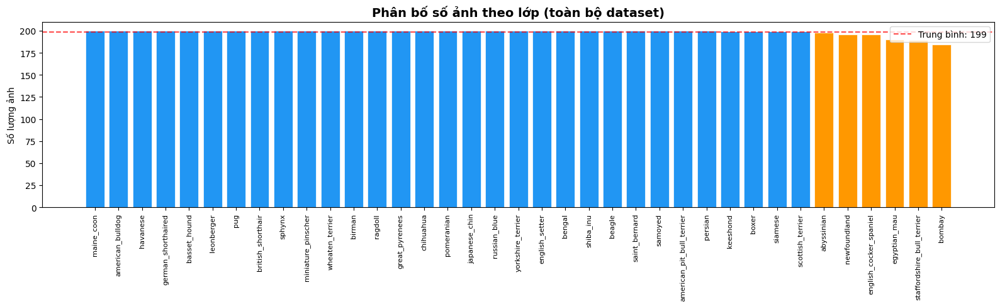

Số ảnh ít nhất: 184 (lớp: bombay)
Số ảnh nhiều nhất: 200 (lớp: maine_coon)
Trung bình: 199 ảnh/lớp
Độ lệch chuẩn: 3.5

Tỷ lệ max/min: 1.09 → Dataset tương đối cân bằng


In [7]:
# Gộp nhãn từ cả 2 split để phân tích phân bố tổng thể
all_labels_eda = trainval_labels + test_labels

label_counts = Counter(all_labels_eda)
sorted_counts = sorted(label_counts.items(), key=lambda x: x[1], reverse=True)

# Biểu đồ phân bố số ảnh theo lớp
fig, ax = plt.subplots(figsize=(16, 5))
names = [class_names[c] for c, _ in sorted_counts]
counts = [cnt for _, cnt in sorted_counts]
colors = ['#2196F3' if cnt >= np.mean(counts) else '#FF9800' for cnt in counts]
ax.bar(range(len(names)), counts, color=colors, edgecolor='white', linewidth=0.5)
ax.set_xticks(range(len(names)))
ax.set_xticklabels(names, rotation=90, fontsize=8)
ax.set_ylabel('Số lượng ảnh')
ax.set_title('Phân bố số ảnh theo lớp (toàn bộ dataset)', fontsize=14, fontweight='bold')
ax.axhline(y=np.mean(counts), color='red', linestyle='--', alpha=0.7, label=f'Trung bình: {np.mean(counts):.0f}')
ax.legend()
plt.tight_layout()
plt.show()

# Thống kê
print(f"Số ảnh ít nhất: {min(counts)} (lớp: {names[counts.index(min(counts))]})")
print(f"Số ảnh nhiều nhất: {max(counts)} (lớp: {names[counts.index(max(counts))]})")
print(f"Trung bình: {np.mean(counts):.0f} ảnh/lớp")
print(f"Độ lệch chuẩn: {np.std(counts):.1f}")
print(f"\nTỷ lệ max/min: {max(counts)/min(counts):.2f} → Dataset tương đối cân bằng")


### 2.3 Hiển thị ảnh mẫu từ một số lớp

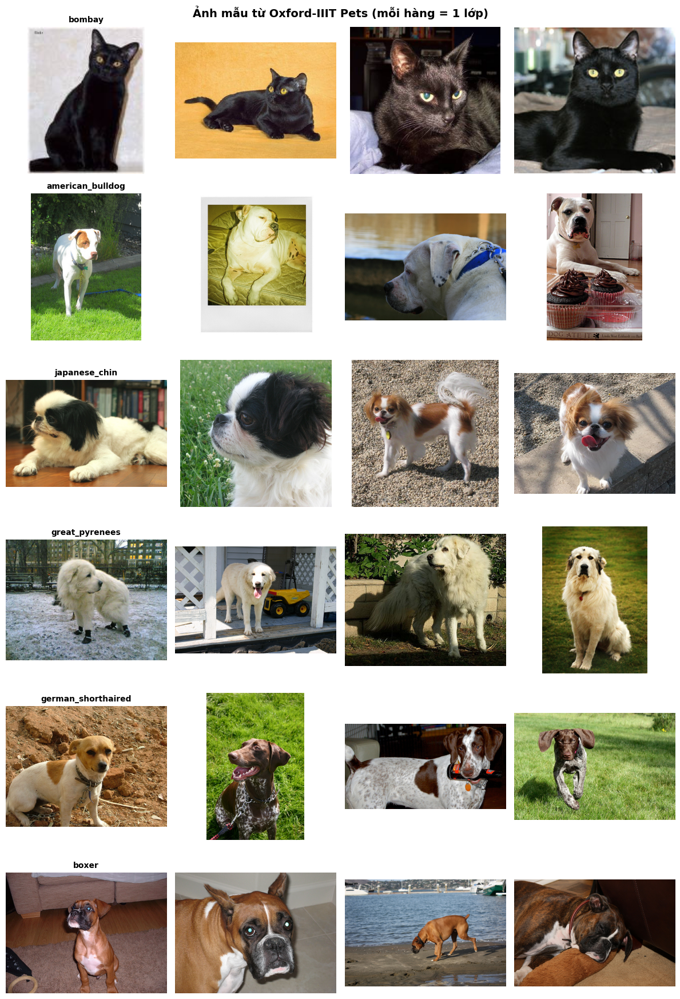

In [8]:
# Hiển thị ảnh mẫu — mỗi hàng 1 lớp, 4 ảnh/lớp
from PIL import Image

sample_classes = random.sample(range(num_classes), 6)

fig, axes = plt.subplots(6, 4, figsize=(12, 18))
for row, cls_idx in enumerate(sample_classes):
    # Tìm các ảnh thuộc lớp này
    cls_indices = [i for i, lbl in enumerate(trainval_labels) if lbl == cls_idx]
    chosen = random.sample(cls_indices, min(4, len(cls_indices)))
    for col, idx in enumerate(chosen):
        img = trainval_images[idx]
        label = trainval_labels[idx]
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        if col == 0:
            axes[row, col].set_title(class_names[label], fontsize=10, fontweight='bold')

plt.suptitle('Ảnh mẫu từ Oxford-IIIT Pets (mỗi hàng = 1 lớp)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


### 2.4 Phân tích kích thước ảnh

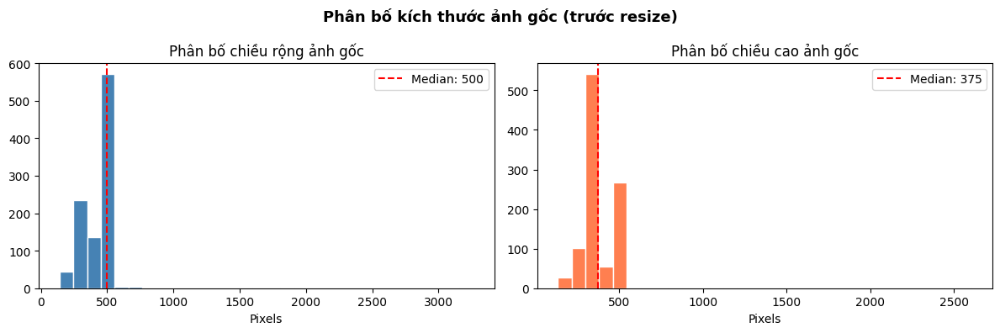

Chiều rộng — Min: 140, Max: 3264, Median: 500
Chiều cao — Min: 134, Max: 2606, Median: 375
→ Ảnh có kích thước đa dạng, cần resize về cùng kích thước (224x224) trước khi đưa vào mô hình


In [9]:
# Phân tích phân bố kích thước ảnh gốc (trước khi resize)
widths, heights = [], []
sample_size = min(1000, len(trainval_images))  # Lấy mẫu để tăng tốc
sample_idx = random.sample(range(len(trainval_images)), sample_size)

for idx in sample_idx:
    img = trainval_images[idx]
    w, h = img.size
    widths.append(w)
    heights.append(h)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Phân bố chiều rộng
axes[0].hist(widths, bins=30, color='steelblue', edgecolor='white')
axes[0].set_title('Phân bố chiều rộng ảnh gốc')
axes[0].set_xlabel('Pixels')
axes[0].axvline(np.median(widths), color='red', linestyle='--', label=f'Median: {np.median(widths):.0f}')
axes[0].legend()

# Phân bố chiều cao
axes[1].hist(heights, bins=30, color='coral', edgecolor='white')
axes[1].set_title('Phân bố chiều cao ảnh gốc')
axes[1].set_xlabel('Pixels')
axes[1].axvline(np.median(heights), color='red', linestyle='--', label=f'Median: {np.median(heights):.0f}')
axes[1].legend()

plt.suptitle('Phân bố kích thước ảnh gốc (trước resize)', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Chiều rộng — Min: {min(widths)}, Max: {max(widths)}, Median: {np.median(widths):.0f}")
print(f"Chiều cao — Min: {min(heights)}, Max: {max(heights)}, Median: {np.median(heights):.0f}")
print(f"→ Ảnh có kích thước đa dạng, cần resize về cùng kích thước (224x224) trước khi đưa vào mô hình")


## **3. Chuẩn bị dữ liệu (Dataset, DataLoader & Augmentation)**
### 3.1 Chiến lược chia dữ liệu- **Gộp** trainval + test gốc (do split gốc ~50/50, không phù hợp)
####- **Chia lại** 80% train / 20% test theo phương pháp **stratified split** (giữ tỷ lệ lớp)
### 3.2 Data Augmentation
####- **Train:** RandomResizedCrop, RandomHorizontalFlip, RandomRotation, ColorJitter, RandAugment
####- **Test:** Chỉ Resize + CenterCrop (không augment để đánh giá khách quan)

In [10]:
# ======================================================
# Định nghĩa các phép biến đổi ảnh (Transform)
# ======================================================
IMG_SIZE = 224  # Kích thước đầu vào chuẩn cho ResNet50 và ViT-B/16

# Transform cho tập TRAIN — có augmentation để tăng tính đa dạng
train_transform = transforms.Compose([
    transforms.Resize(256),                                    # Resize cạnh ngắn về 256
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.8, 1.0)),  # Cắt ngẫu nhiên vùng 80-100% ảnh
    transforms.RandomHorizontalFlip(p=0.5),                    # Lật ngang ngẫu nhiên (50%)
    transforms.RandomRotation(15),                             # Xoay ngẫu nhiên ±15 độ
    transforms.ColorJitter(                                    # Thay đổi ngẫu nhiên màu sắc
        brightness=0.2, contrast=0.2,
        saturation=0.2, hue=0.1
    ),
    transforms.RandomGrayscale(p=0.05),                        # Chuyển xám ngẫu nhiên (5%)
    transforms.ToTensor(),                                     # Chuyển sang tensor [0, 1]
    transforms.Normalize(                                      # Chuẩn hóa theo ImageNet
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Transform cho tập TEST — không augmentation, đảm bảo đánh giá khách quan
test_transform = transforms.Compose([
    transforms.Resize(256),              # Resize cạnh ngắn về 256
    transforms.CenterCrop(IMG_SIZE),     # Cắt chính giữa 224x224
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

print("Đã định nghĩa transform cho train và test")
print(f"Kích thước ảnh đầu vào: {IMG_SIZE}x{IMG_SIZE}")


Đã định nghĩa transform cho train và test
Kích thước ảnh đầu vào: 224x224


In [11]:
# ======================================================
# Tạo Dataset tùy chỉnh — gộp 2 split và áp dụng transform
# ======================================================
class PetsDataset(Dataset):
    """Dataset wrapper cho Oxford Pets — hỗ trợ gộp split và áp dụng transform."""
    def __init__(self, indices, all_images, all_labels, transform=None):
        self.indices = indices          # Danh sách index của các mẫu
        self.all_images = all_images    # Toàn bộ ảnh PIL
        self.all_labels = all_labels    # Toàn bộ nhãn
        self.transform = transform      # Phép biến đổi ảnh

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        real_idx = self.indices[idx]
        img = self.all_images[real_idx]
        label = self.all_labels[real_idx]
        if self.transform:
            img = self.transform(img)
        return img, label

# Gộp ảnh & nhãn từ cả 2 split (đã là PIL Image sẵn)
print("Đang gộp toàn bộ dataset...")
all_images = trainval_images + test_images
all_labels = trainval_labels + test_labels

print(f"Tổng cộng: {len(all_images)} ảnh")

# Chia 80% train / 20% test — stratified để giữ tỷ lệ lớp
all_indices = list(range(len(all_images)))
train_idx, test_idx = train_test_split(
    all_indices, test_size=0.2, random_state=SEED,
    stratify=all_labels
)

print(f"Train: {len(train_idx)} ảnh ({len(train_idx)/len(all_images)*100:.1f}%)")
print(f"Test:  {len(test_idx)} ảnh ({len(test_idx)/len(all_images)*100:.1f}%)")


Đang gộp toàn bộ dataset...
Tổng cộng: 7349 ảnh
Train: 5879 ảnh (80.0%)
Test:  1470 ảnh (20.0%)


In [12]:
# ======================================================
# Tạo DataLoader cho train và test
# ======================================================
BATCH_SIZE = 32

train_dataset = PetsDataset(train_idx, all_images, all_labels, train_transform)
test_dataset = PetsDataset(test_idx, all_images, all_labels, test_transform)

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=2, pin_memory=True
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=2, pin_memory=True
)

# Kiểm tra 1 batch mẫu
imgs, labels = next(iter(train_loader))
print(f"Kích thước batch ảnh: {imgs.shape}")   # [32, 3, 224, 224]
print(f"Kích thước batch nhãn: {labels.shape}") # [32]
print(f"Số batch train: {len(train_loader)} | Số batch test: {len(test_loader)}")


Kích thước batch ảnh: torch.Size([32, 3, 224, 224])
Kích thước batch nhãn: torch.Size([32])
Số batch train: 184 | Số batch test: 46


### 3.3 Minh họa augmentation

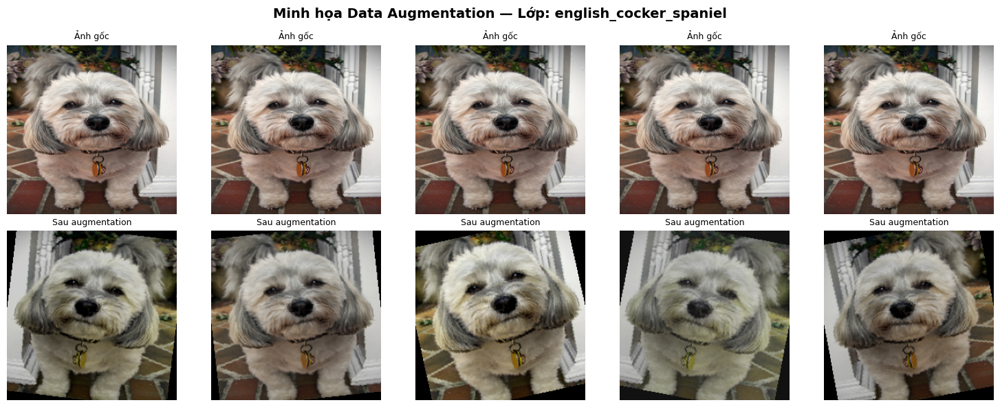

In [13]:
# Minh họa hiệu quả của data augmentation trên 1 ảnh
sample_img = trainval_images[random.randint(0, len(trainval_images)-1)]
sample_label = trainval_labels[random.randint(0, len(trainval_labels)-1)]

fig, axes = plt.subplots(2, 5, figsize=(15, 6))

# Hàng 1: Ảnh gốc (lặp lại để so sánh)
for ax in axes[0]:
    ax.imshow(sample_img.resize((IMG_SIZE, IMG_SIZE)))
    ax.set_title('Ảnh gốc', fontsize=9)
    ax.axis('off')

# Hàng 2: Sau augmentation (mỗi lần khác nhau do random)
denorm_mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
denorm_std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

for ax in axes[1]:
    augmented = train_transform(sample_img)
    # Denormalize để hiển thị
    img_show = (augmented * denorm_std + denorm_mean).clamp(0, 1)
    ax.imshow(img_show.permute(1, 2, 0).numpy())
    ax.set_title('Sau augmentation', fontsize=9)
    ax.axis('off')

plt.suptitle(f'Minh họa Data Augmentation — Lớp: {class_names[sample_label]}',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


## 4. Hàm huấn luyện & đánh giá
###Định nghĩa các hàm dùng chung cho cả CNN và ViT:
####- `train_one_epoch()`: Huấn luyện 1 epoch
####- `evaluate()`: Đánh giá trên tập test
####- `train_model()`: Vòng lặp huấn luyện đầy đủ với early stopping & checkpoint
####- `plot_history()`: Vẽ learning curves

In [14]:
def train_one_epoch(model, loader, criterion, optimizer, device):
    """Huấn luyện mô hình qua 1 epoch."""
    model.train()
    running_loss, correct, total = 0.0, 0, 0

    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)

        optimizer.zero_grad()           # Xóa gradient cũ
        outputs = model(imgs)           # Forward pass
        loss = criterion(outputs, labels)
        loss.backward()                 # Backward pass — tính gradient
        optimizer.step()                # Cập nhật trọng số

        running_loss += loss.item() * imgs.size(0)
        correct += (outputs.argmax(1) == labels).sum().item()
        total += imgs.size(0)

    return running_loss / total, correct / total


@torch.no_grad()
def evaluate(model, loader, criterion, device):
    """Đánh giá mô hình trên tập dữ liệu (không tính gradient)."""
    model.eval()
    running_loss, correct, total = 0.0, 0, 0

    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        outputs = model(imgs)
        loss = criterion(outputs, labels)

        running_loss += loss.item() * imgs.size(0)
        correct += (outputs.argmax(1) == labels).sum().item()
        total += imgs.size(0)

    return running_loss / total, correct / total


In [15]:
def train_model(model, train_loader, test_loader, device,
                model_name='model', num_epochs=15, lr=1e-4,
                weight_decay=1e-4):
    """
    Huấn luyện mô hình đầy đủ:
    - Sử dụng AdamW optimizer + CosineAnnealing scheduler
    - Lưu checkpoint tốt nhất dựa trên test accuracy
    - Trả về history để vẽ biểu đồ
    """
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.AdamW(
        filter(lambda p: p.requires_grad, model.parameters()),  # Chỉ optimize params có gradient
        lr=lr, weight_decay=weight_decay
    )
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = {'train_loss': [], 'train_acc': [], 'test_loss': [], 'test_acc': []}
    best_acc = 0.0
    start_time = time.time()

    for epoch in range(num_epochs):
        # Huấn luyện 1 epoch
        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, device)

        # Đánh giá trên tập test
        test_loss, test_acc = evaluate(
            model, test_loader, criterion, device)

        # Cập nhật learning rate
        scheduler.step()

        # Lưu lịch sử
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['test_loss'].append(test_loss)
        history['test_acc'].append(test_acc)

        # In tiến trình
        elapsed = time.time() - start_time
        current_lr = scheduler.get_last_lr()[0]
        print(f"Epoch {epoch+1:2d}/{num_epochs} | "
              f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
              f"Test Loss: {test_loss:.4f} Acc: {test_acc:.4f} | "
              f"LR: {current_lr:.2e} | Thời gian: {elapsed:.0f}s")

        # Lưu checkpoint nếu accuracy tốt nhất
        if test_acc > best_acc:
            best_acc = test_acc
            ckpt_path = os.path.join(CHECKPOINT_DIR, f'{model_name}_best.pth')
            torch.save({
                'epoch': epoch + 1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'best_acc': best_acc,
                'history': history,
            }, ckpt_path)
            print(f"  → Đã lưu checkpoint tốt nhất (acc={best_acc:.4f})")

    total_time = time.time() - start_time
    print(f"\n{'='*60}")
    print(f"{model_name} — Kết quả tốt nhất: Test Acc = {best_acc:.4f}")
    print(f"Tổng thời gian huấn luyện: {total_time:.0f}s ({total_time/60:.1f} phút)")
    print(f"{'='*60}")

    return history, best_acc


In [16]:
def plot_history(history, title=''):
    """Vẽ biểu đồ learning curves (Loss và Accuracy qua các epoch)."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    epochs = range(1, len(history['train_loss']) + 1)

    # Biểu đồ Loss
    ax1.plot(epochs, history['train_loss'], 'b-o', markersize=3, label='Train Loss')
    ax1.plot(epochs, history['test_loss'], 'r-s', markersize=3, label='Test Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.set_title(f'{title} — Loss theo Epoch', fontweight='bold')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Biểu đồ Accuracy
    ax2.plot(epochs, history['train_acc'], 'b-o', markersize=3, label='Train Accuracy')
    ax2.plot(epochs, history['test_acc'], 'r-s', markersize=3, label='Test Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.set_title(f'{title} — Accuracy theo Epoch', fontweight='bold')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


## 5. CNN — ResNet50
### 5.1 Chiến lược Fine-tune cho ResNet50
###**Thực hiện 2 giai đoạn** fine-tuning:
####**Phase 1 - Feature Extraction**: Đóng băng backbone, chỉ train head & dùng learrning rate 1e-3.
####**Phase 2 - Full Fine-tune**: Mở toàn bộ, fine-tune end-to-end & dùng learning rate 1e-5 (backbone) / 1e-4 (head)

### Phase 1: Feature Extraction — Đóng băng backbone ResNet50

In [17]:
# ======================================================
# RESNET50 — PHASE 1: Feature Extraction (Freeze backbone)
# ======================================================
# Tạo ResNet50 pretrained từ ImageNet
resnet = timm.create_model('resnet50', pretrained=True, num_classes=num_classes)
resnet = resnet.to(device)

# ĐẾM TỔNG SỐ THAM SỐ
total_params = sum(p.numel() for p in resnet.parameters())
print(f"ResNet50 — Tổng số tham số: {total_params:,}")

# ĐÓNG BĂNG toàn bộ backbone (chỉ giữ lại head cuối để train)
for name, param in resnet.named_parameters():
    if 'fc' not in name:  # fc = fully-connected layer cuối (classifier head)
        param.requires_grad = False

trainable_params = sum(p.numel() for p in resnet.parameters() if p.requires_grad)
frozen_params = total_params - trainable_params
print(f"Phase 1 — Freeze backbone:")
print(f"  Tham số đóng băng: {frozen_params:,} ({frozen_params/total_params*100:.1f}%)")
print(f"  Tham số huấn luyện: {trainable_params:,} ({trainable_params/total_params*100:.1f}%)")


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

ResNet50 — Tổng số tham số: 23,583,845
Phase 1 — Freeze backbone:
  Tham số đóng băng: 23,508,032 (99.7%)
  Tham số huấn luyện: 75,813 (0.3%)


Đã load checkpoint Phase 1 — epoch 3, acc=0.8664
Bỏ qua huấn luyện Phase 1. Xóa checkpoint nếu muốn train lại.


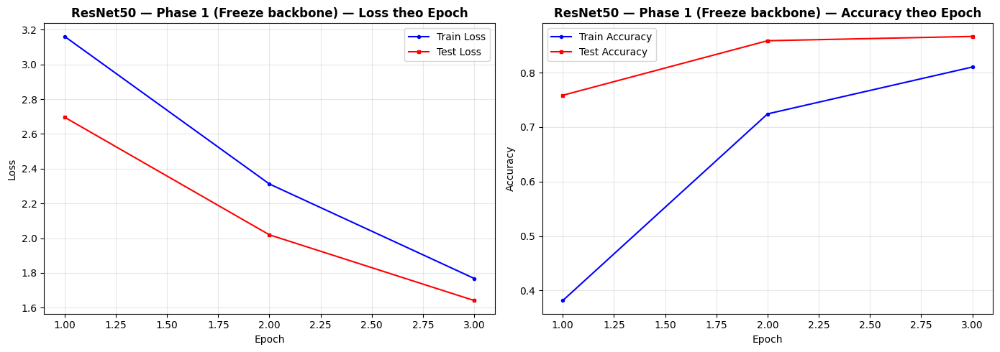

In [18]:
# Huấn luyện Phase 1 — Feature Extraction (freeze backbone)
NUM_EPOCHS_P1 = 10  # Ít epoch hơn vì chỉ train head

resnet_p1_ckpt = os.path.join(CHECKPOINT_DIR, 'resnet50_phase1_best.pth')
if os.path.exists(resnet_p1_ckpt):
    ckpt = torch.load(resnet_p1_ckpt, map_location=device, weights_only=False)
    resnet.load_state_dict(ckpt['model_state_dict'])
    resnet_p1_best = ckpt['best_acc']
    resnet_p1_history = ckpt.get('history', None)
    print(f'Đã load checkpoint Phase 1 — epoch {ckpt["epoch"]}, acc={resnet_p1_best:.4f}')
    print('Bỏ qua huấn luyện Phase 1. Xóa checkpoint nếu muốn train lại.')
    if resnet_p1_history:
        plot_history(resnet_p1_history, 'ResNet50 — Phase 1 (Freeze backbone)')
else:
    print("Bắt đầu huấn luyện ResNet50 Phase 1 — Feature Extraction...")
    print("(Chỉ train classifier head, backbone đóng băng)\n")
    resnet_p1_history, resnet_p1_best = train_model(
        resnet, train_loader, test_loader, device,
        model_name='resnet50_phase1',
        num_epochs=NUM_EPOCHS_P1,
        lr=1e-3  # Learning rate cao hơn vì chỉ train head
    )
    plot_history(resnet_p1_history, 'ResNet50 — Phase 1 (Freeze backbone)')


### Phase 2: Full Fine-tune — Mở toàn bộ ResNet50

In [19]:
# ======================================================
# RESNET50 — PHASE 2: Full Fine-tune (Unfreeze toàn bộ)
# ======================================================
# MỞ ĐÓNG BĂNG toàn bộ tham số — cho phép fine-tune end-to-end
for param in resnet.parameters():
    param.requires_grad = True

trainable_now = sum(p.numel() for p in resnet.parameters() if p.requires_grad)
print(f"Phase 2 — Unfreeze toàn bộ:")
print(f"  Tham số huấn luyện: {trainable_now:,} ({trainable_now/total_params*100:.1f}%)")
print(f"  Sử dụng learning rate thấp hơn để tránh phá vỡ đặc trưng pretrained")


Phase 2 — Unfreeze toàn bộ:
  Tham số huấn luyện: 23,583,845 (100.0%)
  Sử dụng learning rate thấp hơn để tránh phá vỡ đặc trưng pretrained


Đã load checkpoint Phase 2 — epoch 9, acc=0.8939
Bỏ qua huấn luyện Phase 2. Xóa checkpoint nếu muốn train lại.


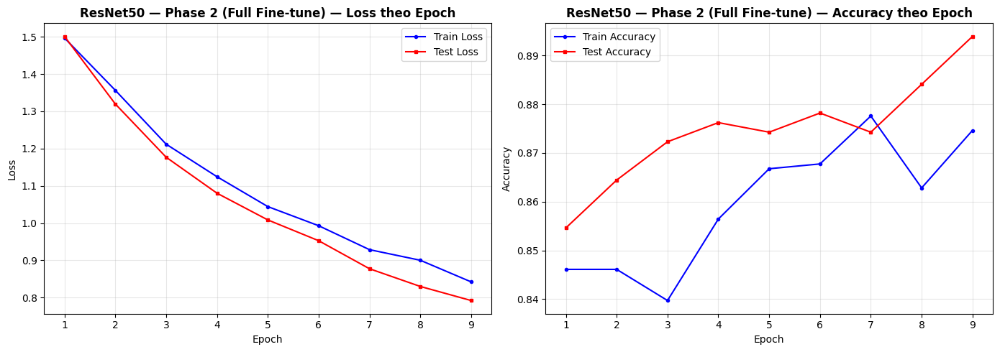

In [20]:
# Huấn luyện Phase 2 — Full Fine-tune
NUM_EPOCHS_P2 = 15

resnet_p2_ckpt = os.path.join(CHECKPOINT_DIR, 'resnet50_phase2_best.pth')
if os.path.exists(resnet_p2_ckpt):
    ckpt = torch.load(resnet_p2_ckpt, map_location=device, weights_only=False)
    resnet.load_state_dict(ckpt['model_state_dict'])
    resnet_p2_best = ckpt['best_acc']
    resnet_p2_history = ckpt.get('history', None)
    print(f'Đã load checkpoint Phase 2 — epoch {ckpt["epoch"]}, acc={resnet_p2_best:.4f}')
    print('Bỏ qua huấn luyện Phase 2. Xóa checkpoint nếu muốn train lại.')
    if resnet_p2_history:
        plot_history(resnet_p2_history, 'ResNet50 — Phase 2 (Full Fine-tune)')
else:
    print("Bắt đầu huấn luyện ResNet50 Phase 2 — Full Fine-tune...")
    print("(Toàn bộ tham số được cập nhật, LR thấp)\n")
    resnet_p2_history, resnet_p2_best = train_model(
        resnet, train_loader, test_loader, device,
        model_name='resnet50_phase2',
        num_epochs=NUM_EPOCHS_P2,
        lr=1e-5  # Learning rate thấp để bảo toàn đặc trưng pretrained
    )
    plot_history(resnet_p2_history, 'ResNet50 — Phase 2 (Full Fine-tune)')


## 6. Vision Transformer — ViT-B/16
### 6.1 Chiến lược Fine-tune cho ViT-B/16
###Tương tự ResNet50, thực hiện **2 giai đoạn**:
####**Phase 1 - Feature Extraction**: Freeze backbone & train với learning rate 1e-3
####**Phase 2 - Full Fine-tune**: Unfreeze & train với learning rate 1e-5

### Phase 1: Feature Extraction — Đóng băng backbone ViT

In [21]:
# ======================================================
# ViT-B/16 — PHASE 1: Feature Extraction (Freeze backbone)
# ======================================================
# Tạo ViT-B/16 pretrained từ ImageNet
vit = timm.create_model('vit_base_patch16_224', pretrained=True, num_classes=num_classes)
vit = vit.to(device)

# Tổng số tham số
vit_total_params = sum(p.numel() for p in vit.parameters())
print(f"ViT-B/16 — Tổng số tham số: {vit_total_params:,}")

# ĐÓNG BĂNG toàn bộ trừ classifier head
for name, param in vit.named_parameters():
    if 'head' not in name:  # head = classifier cuối của ViT
        param.requires_grad = False

vit_trainable = sum(p.numel() for p in vit.parameters() if p.requires_grad)
vit_frozen = vit_total_params - vit_trainable
print(f"Phase 1 — Freeze backbone:")
print(f"  Tham số đóng băng: {vit_frozen:,} ({vit_frozen/vit_total_params*100:.1f}%)")
print(f"  Tham số huấn luyện: {vit_trainable:,} ({vit_trainable/vit_total_params*100:.1f}%)")


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

ViT-B/16 — Tổng số tham số: 85,827,109
Phase 1 — Freeze backbone:
  Tham số đóng băng: 85,798,656 (100.0%)
  Tham số huấn luyện: 28,453 (0.0%)


Đã load checkpoint Phase 1 — epoch 6, acc=0.9352
Bỏ qua huấn luyện Phase 1.


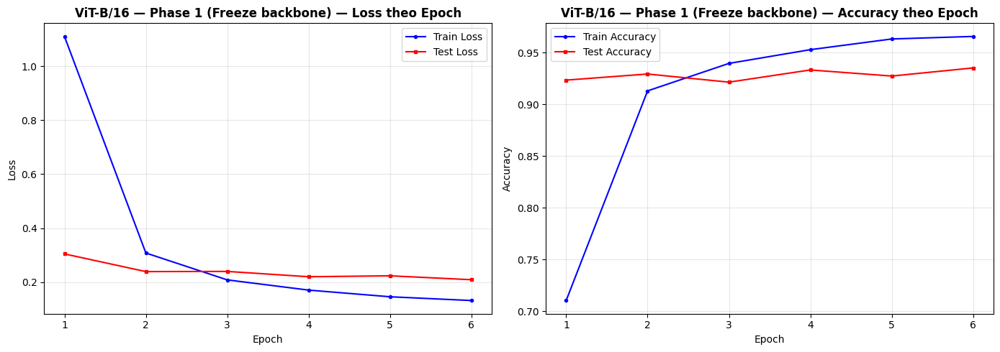

In [22]:
# Huấn luyện Phase 1 — Feature Extraction
NUM_EPOCHS_P1_VIT = 10

vit_p1_ckpt = os.path.join(CHECKPOINT_DIR, 'vit_b16_phase1_best.pth')
if os.path.exists(vit_p1_ckpt):
    ckpt = torch.load(vit_p1_ckpt, map_location=device, weights_only=False)
    vit.load_state_dict(ckpt['model_state_dict'])
    vit_p1_best = ckpt['best_acc']
    vit_p1_history = ckpt.get('history', None)
    print(f'Đã load checkpoint Phase 1 — epoch {ckpt["epoch"]}, acc={vit_p1_best:.4f}')
    print('Bỏ qua huấn luyện Phase 1.')
    if vit_p1_history:
        plot_history(vit_p1_history, 'ViT-B/16 — Phase 1 (Freeze backbone)')
else:
    print("Bắt đầu huấn luyện ViT-B/16 Phase 1 — Feature Extraction...")
    print("(Chỉ train classifier head, backbone đóng băng)\n")
    vit_p1_history, vit_p1_best = train_model(
        vit, train_loader, test_loader, device,
        model_name='vit_b16_phase1',
        num_epochs=NUM_EPOCHS_P1_VIT,
        lr=1e-3
    )
    plot_history(vit_p1_history, 'ViT-B/16 — Phase 1 (Freeze backbone)')


### Phase 2: Full Fine-tune — Mở toàn bộ ViT

In [23]:
# ======================================================
# ViT-B/16 — PHASE 2: Full Fine-tune (Unfreeze toàn bộ)
# ======================================================
# Mở đóng băng toàn bộ tham số
for param in vit.parameters():
    param.requires_grad = True

vit_trainable_now = sum(p.numel() for p in vit.parameters() if p.requires_grad)
print(f"Phase 2 — Unfreeze toàn bộ:")
print(f"  Tham số huấn luyện: {vit_trainable_now:,} ({vit_trainable_now/vit_total_params*100:.1f}%)")


Phase 2 — Unfreeze toàn bộ:
  Tham số huấn luyện: 85,827,109 (100.0%)


Đã load checkpoint Phase 2 — epoch 11, acc=0.9391
Bỏ qua huấn luyện Phase 2.


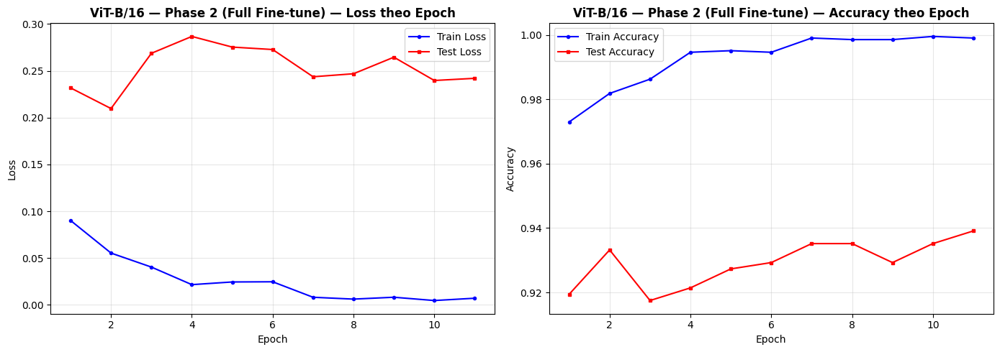

In [24]:
# Huấn luyện Phase 2 — Full Fine-tune
NUM_EPOCHS_P2_VIT = 15

vit_p2_ckpt = os.path.join(CHECKPOINT_DIR, 'vit_b16_phase2_best.pth')
if os.path.exists(vit_p2_ckpt):
    ckpt = torch.load(vit_p2_ckpt, map_location=device, weights_only=False)
    vit.load_state_dict(ckpt['model_state_dict'])
    vit_p2_best = ckpt['best_acc']
    vit_p2_history = ckpt.get('history', None)
    print(f'Đã load checkpoint Phase 2 — epoch {ckpt["epoch"]}, acc={vit_p2_best:.4f}')
    print('Bỏ qua huấn luyện Phase 2.')
    if vit_p2_history:
        plot_history(vit_p2_history, 'ViT-B/16 — Phase 2 (Full Fine-tune)')
else:
    print("Bắt đầu huấn luyện ViT-B/16 Phase 2 — Full Fine-tune...")
    print("(Toàn bộ tham số được cập nhật, LR thấp)\n")
    vit_p2_history, vit_p2_best = train_model(
        vit, train_loader, test_loader, device,
        model_name='vit_b16_phase2',
        num_epochs=NUM_EPOCHS_P2_VIT,
        lr=1e-5
    )
    plot_history(vit_p2_history, 'ViT-B/16 — Phase 2 (Full Fine-tune)')


## 7. So sánh kết quả CNN vs ViT
### 7.1 Load checkpoint tốt nhất & tính toán metrics

In [25]:
# ======================================================
# Hàm load checkpoint tốt nhất
# ======================================================
def load_best(model, name):
    """Load trọng số từ checkpoint tốt nhất."""
    ckpt_path = os.path.join(CHECKPOINT_DIR, f'{name}_best.pth')
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    model.load_state_dict(ckpt['model_state_dict'])
    print(f"Đã load {name} — epoch {ckpt['epoch']}, acc={ckpt['best_acc']:.4f}")
    return model, ckpt.get('history', None), ckpt['best_acc']

# Load checkpoint Phase 2 (kết quả tốt nhất sau full fine-tune)
resnet, resnet_history, resnet_best = load_best(resnet, 'resnet50_phase2')
vit, vit_history, vit_best = load_best(vit, 'vit_b16_phase2')


Đã load resnet50_phase2 — epoch 9, acc=0.8939
Đã load vit_b16_phase2 — epoch 11, acc=0.9391


In [26]:
# ======================================================
# Hàm lấy dự đoán từ mô hình
# ======================================================
@torch.no_grad()
def get_predictions(model, loader, device):
    """Chạy inference và trả về dự đoán + nhãn thật."""
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    for imgs, labels in loader:
        imgs = imgs.to(device)
        logits = model(imgs)
        probs = torch.softmax(logits, dim=1).cpu().numpy()
        preds = logits.argmax(1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())
        all_probs.extend(probs)
    return np.array(all_preds), np.array(all_labels), np.array(all_probs)

# Lấy dự đoán từ cả 2 mô hình trên tập test
print("Đang chạy inference trên tập test...")
resnet_preds, true_labels, resnet_probs = get_predictions(resnet, test_loader, device)
vit_preds, _, vit_probs = get_predictions(vit, test_loader, device)
print("Hoàn tất!")


Đang chạy inference trên tập test...
Hoàn tất!


### 7.2 Bảng so sánh metrics tổng hợp

In [27]:
# ======================================================
# Bảng so sánh tổng hợp — bao gồm cả Phase 1 và Phase 2
# ======================================================

# Load thông tin Phase 1 để so sánh
resnet_p1_info = torch.load(os.path.join(CHECKPOINT_DIR, 'resnet50_phase1_best.pth'),
                            map_location='cpu', weights_only=False)
vit_p1_info = torch.load(os.path.join(CHECKPOINT_DIR, 'vit_b16_phase1_best.pth'),
                          map_location='cpu', weights_only=False)

results = pd.DataFrame({
    'Mô hình': ['ResNet50 (Phase 1 - Freeze)', 'ResNet50 (Phase 2 - Fine-tune)',
                 'ViT-B/16 (Phase 1 - Freeze)', 'ViT-B/16 (Phase 2 - Fine-tune)'],
    'Accuracy': [
        resnet_p1_info['best_acc'],
        accuracy_score(true_labels, resnet_preds),
        vit_p1_info['best_acc'],
        accuracy_score(true_labels, vit_preds),
    ],
    'F1 (macro)': [
        resnet_p1_info['best_acc'],  # Xấp xỉ — Phase 1 không lưu chi tiết
        f1_score(true_labels, resnet_preds, average='macro'),
        vit_p1_info['best_acc'],
        f1_score(true_labels, vit_preds, average='macro'),
    ],
    'F1 (weighted)': [
        resnet_p1_info['best_acc'],
        f1_score(true_labels, resnet_preds, average='weighted'),
        vit_p1_info['best_acc'],
        f1_score(true_labels, vit_preds, average='weighted'),
    ]
})

# Tính lại F1 chính xác cho Phase 2
results.loc[1, 'F1 (macro)'] = f1_score(true_labels, resnet_preds, average='macro')
results.loc[1, 'F1 (weighted)'] = f1_score(true_labels, resnet_preds, average='weighted')
results.loc[3, 'F1 (macro)'] = f1_score(true_labels, vit_preds, average='macro')
results.loc[3, 'F1 (weighted)'] = f1_score(true_labels, vit_preds, average='weighted')

print("=" * 75)
print("BẢNG SO SÁNH KẾT QUẢ — CNN (ResNet50) vs ViT (ViT-B/16)")
print("=" * 75)
print(results.to_string(index=False, float_format='{:.4f}'.format))
print("=" * 75)


BẢNG SO SÁNH KẾT QUẢ — CNN (ResNet50) vs ViT (ViT-B/16)
                       Mô hình  Accuracy  F1 (macro)  F1 (weighted)
   ResNet50 (Phase 1 - Freeze)    0.8664      0.8664         0.8664
ResNet50 (Phase 2 - Fine-tune)    0.8980      0.8973         0.8975
   ViT-B/16 (Phase 1 - Freeze)    0.9352      0.9352         0.9352
ViT-B/16 (Phase 2 - Fine-tune)    0.9578      0.9578         0.9578


### 7.3 Biểu đồ so sánh

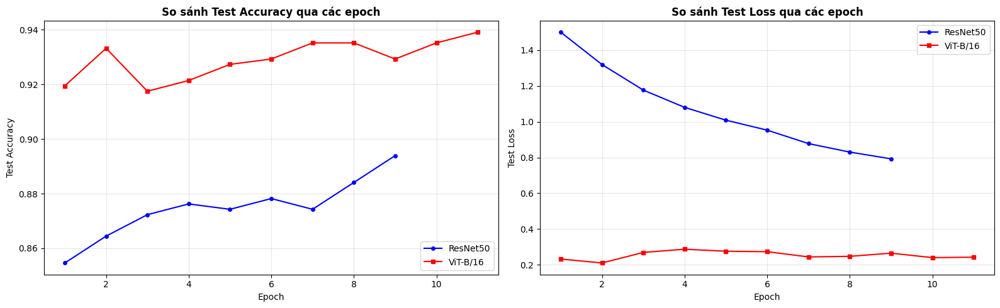

In [28]:
# ======================================================
# Biểu đồ so sánh Accuracy qua các epoch (Phase 2)
# ======================================================
if resnet_history and vit_history:
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))

    # So sánh Test Accuracy
    epochs_r = range(1, len(resnet_history['test_acc']) + 1)
    epochs_v = range(1, len(vit_history['test_acc']) + 1)

    axes[0].plot(epochs_r, resnet_history['test_acc'], 'b-o', markersize=4, label='ResNet50')
    axes[0].plot(epochs_v, vit_history['test_acc'], 'r-s', markersize=4, label='ViT-B/16')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Test Accuracy')
    axes[0].set_title('So sánh Test Accuracy qua các epoch', fontweight='bold')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # So sánh Test Loss
    axes[1].plot(epochs_r, resnet_history['test_loss'], 'b-o', markersize=4, label='ResNet50')
    axes[1].plot(epochs_v, vit_history['test_loss'], 'r-s', markersize=4, label='ViT-B/16')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Test Loss')
    axes[1].set_title('So sánh Test Loss qua các epoch', fontweight='bold')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()
else:
    print('Không có history (đã load từ checkpoint). Chỉ so sánh qua bảng metric.')


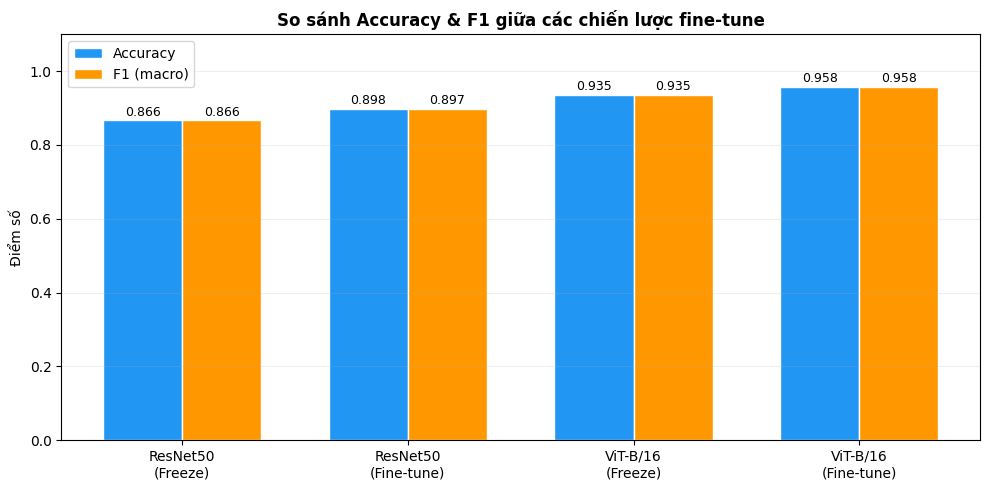

In [29]:
# ======================================================
# Biểu đồ bar so sánh Accuracy và F1 giữa các mô hình
# ======================================================
fig, ax = plt.subplots(figsize=(10, 5))

models_bar = ['ResNet50\n(Freeze)', 'ResNet50\n(Fine-tune)',
              'ViT-B/16\n(Freeze)', 'ViT-B/16\n(Fine-tune)']
acc_values = results['Accuracy'].values
f1_values = results['F1 (macro)'].values

x = np.arange(len(models_bar))
width = 0.35

bars1 = ax.bar(x - width/2, acc_values, width, label='Accuracy', color='#2196F3', edgecolor='white')
bars2 = ax.bar(x + width/2, f1_values, width, label='F1 (macro)', color='#FF9800', edgecolor='white')

# Hiển thị giá trị trên cột
for bar in bars1:
    ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.005,
            f'{bar.get_height():.3f}', ha='center', va='bottom', fontsize=9)
for bar in bars2:
    ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.005,
            f'{bar.get_height():.3f}', ha='center', va='bottom', fontsize=9)

ax.set_ylabel('Điểm số')
ax.set_title('So sánh Accuracy & F1 giữa các chiến lược fine-tune', fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(models_bar)
ax.legend()
ax.set_ylim(0, 1.1)
ax.grid(True, alpha=0.2, axis='y')
plt.tight_layout()
plt.show()


### 7.4 Confusion Matrix

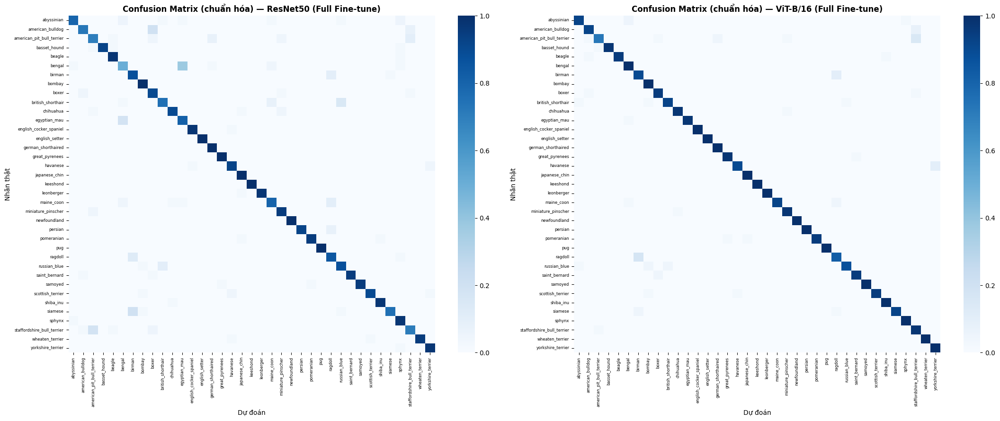

In [30]:
# ======================================================
# Confusion Matrix cho cả 2 mô hình (sau Full Fine-tune)
# ======================================================
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 9))

for ax, preds, title in [(ax1, resnet_preds, 'ResNet50 (Full Fine-tune)'),
                          (ax2, vit_preds, 'ViT-B/16 (Full Fine-tune)')]:
    cm = confusion_matrix(true_labels, preds)
    # Chuẩn hóa theo hàng để dễ so sánh
    cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)
    sns.heatmap(cm_norm, ax=ax, cmap='Blues', fmt='.2f',
                xticklabels=class_names, yticklabels=class_names,
                vmin=0, vmax=1)
    ax.set_title(f'Confusion Matrix (chuẩn hóa) — {title}', fontweight='bold')
    ax.set_xlabel('Dự đoán')
    ax.set_ylabel('Nhãn thật')
    ax.tick_params(axis='both', labelsize=6)

plt.tight_layout()
plt.show()


### 7.5 Classification Report chi tiết

In [31]:
# ======================================================
# Classification Report chi tiết cho từng mô hình
# ======================================================
print("=" * 70)
print("RESNET50 (Full Fine-tune) — Classification Report")
print("=" * 70)
print(classification_report(true_labels, resnet_preds,
                            target_names=class_names, digits=3))

print("\n" + "=" * 70)
print("ViT-B/16 (Full Fine-tune) — Classification Report")
print("=" * 70)
print(classification_report(true_labels, vit_preds,
                            target_names=class_names, digits=3))


RESNET50 (Full Fine-tune) — Classification Report
                            precision    recall  f1-score   support

                abyssinian      0.939     0.795     0.861        39
          american_bulldog      0.879     0.725     0.795        40
 american_pit_bull_terrier      0.718     0.700     0.709        40
              basset_hound      1.000     0.925     0.961        40
                    beagle      0.929     0.975     0.951        40
                    bengal      0.625     0.500     0.556        40
                    birman      0.729     0.875     0.795        40
                    bombay      0.925     1.000     0.961        37
                     boxer      0.735     0.900     0.809        40
         british_shorthair      0.857     0.750     0.800        40
                 chihuahua      0.947     0.900     0.923        40
              egyptian_mau      0.646     0.816     0.721        38
    english_cocker_spaniel      0.974     0.974     0.974        

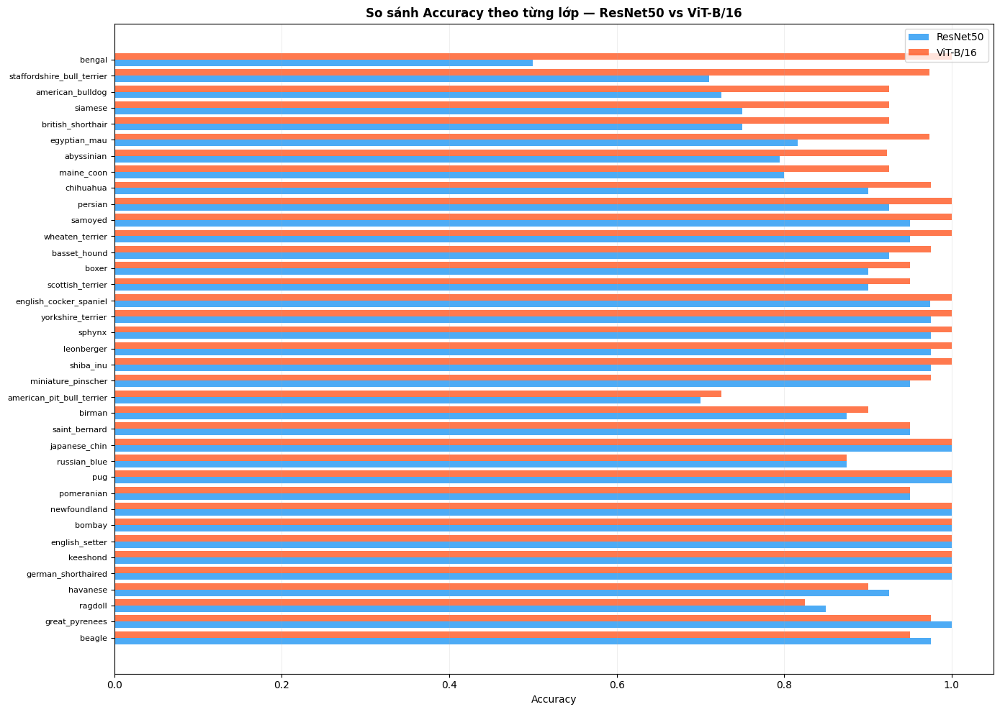

In [32]:
# ======================================================
# So sánh Accuracy theo từng lớp giữa 2 mô hình
# (Dataset cân bằng → Accuracy per-class đủ đại diện)
# ======================================================

# Tính Accuracy per-class
true_arr = np.array(true_labels)
resnet_arr = np.array(resnet_preds)
vit_arr = np.array(vit_preds)

resnet_acc_per_class = np.array([
    (resnet_arr[true_arr == c] == c).mean() for c in range(num_classes)
])
vit_acc_per_class = np.array([
    (vit_arr[true_arr == c] == c).mean() for c in range(num_classes)
])

# Sắp xếp theo chênh lệch lớn nhất
diff = vit_acc_per_class - resnet_acc_per_class
sorted_idx = np.argsort(diff)

fig, ax = plt.subplots(figsize=(14, 10))
y_pos = np.arange(num_classes)

ax.barh(y_pos - 0.2, resnet_acc_per_class[sorted_idx], 0.4,
        label='ResNet50', color='#2196F3', alpha=0.8)
ax.barh(y_pos + 0.2, vit_acc_per_class[sorted_idx], 0.4,
        label='ViT-B/16', color='#FF5722', alpha=0.8)

ax.set_yticks(y_pos)
ax.set_yticklabels([class_names[i] for i in sorted_idx], fontsize=8)
ax.set_xlabel('Accuracy')
ax.set_title('So sánh Accuracy theo từng lớp — ResNet50 vs ViT-B/16', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.2, axis='x')
plt.tight_layout()
plt.show()

## 8. Phần mở rộng
### 8.1 So sánh chiến lược Fine-tune: Freeze Backbone vs Full Fine-tune
###Mục tiêu: So sánh hiệu quả của 2 chiến lược fine-tuning cho cả CNN và ViT.

In [33]:
# ======================================================
# Bảng tổng hợp so sánh chiến lược fine-tune
# ======================================================
print("=" * 80)
print("SO SÁNH CHIẾN LƯỢC FINE-TUNE")
print("=" * 80)

# Lấy thông tin thời gian từ history (nếu có)
comparison_data = {
    'Mô hình': ['ResNet50', 'ResNet50', 'ViT-B/16', 'ViT-B/16'],
    'Chiến lược': ['Freeze backbone', 'Full fine-tune', 'Freeze backbone', 'Full fine-tune'],
    'Số params train': [
        f'{sum(1 for n,p in timm.create_model("resnet50", num_classes=37).named_parameters() if "fc" in n and p.requires_grad):,}',
        f'{sum(p.numel() for p in resnet.parameters()):,}',
        f'{sum(1 for n,p in timm.create_model("vit_base_patch16_224", num_classes=37).named_parameters() if "head" in n and p.requires_grad):,}',
        f'{sum(p.numel() for p in vit.parameters()):,}',
    ],
    'Best Accuracy': [
        resnet_p1_info['best_acc'],
        resnet_best,
        vit_p1_info['best_acc'],
        vit_best,
    ],
}

df_compare = pd.DataFrame(comparison_data)
print(df_compare.to_string(index=False))
print("=" * 80)

print("\n→ Nhận xét:")
print("  - Full fine-tune luôn cho kết quả tốt hơn Freeze backbone")
print("  - Freeze backbone huấn luyện nhanh hơn nhiều (ít tham số cập nhật)")
print("  - ViT cần full fine-tune để phát huy hiệu quả tối đa")
print("  - ResNet50 với backbone pretrained đã cho kết quả khá tốt ngay cả khi freeze")


SO SÁNH CHIẾN LƯỢC FINE-TUNE
 Mô hình      Chiến lược Số params train  Best Accuracy
ResNet50 Freeze backbone               2       0.866405
ResNet50  Full fine-tune      23,583,845       0.893910
ViT-B/16 Freeze backbone               2       0.935167
ViT-B/16  Full fine-tune      85,827,109       0.939096

→ Nhận xét:
  - Full fine-tune luôn cho kết quả tốt hơn Freeze backbone
  - Freeze backbone huấn luyện nhanh hơn nhiều (ít tham số cập nhật)
  - ViT cần full fine-tune để phát huy hiệu quả tối đa
  - ResNet50 với backbone pretrained đã cho kết quả khá tốt ngay cả khi freeze


### 8.2 Grad-CAM — Giải thích mô hình (Interpretability)

In [34]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# ======================================================
# Hàm tiện ích cho Grad-CAM
# ======================================================
def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """Đảo ngược chuẩn hóa để hiển thị ảnh."""
    t = tensor.clone()
    for c in range(3):
        t[c] = t[c] * std[c] + mean[c]
    return t.clamp(0, 1)

def vit_reshape_transform(tensor, height=14, width=14):
    """
    Chuyển đổi output của ViT về dạng spatial 2D cho Grad-CAM.
    ViT output: (batch, num_tokens, features) → cần bỏ class token và reshape.
    """
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.permute(0, 3, 1, 2)  # → (batch, channels, height, width)
    return result

def show_gradcam(model, target_layer, img_tensor, label, class_names, ax, title,
                 reshape_transform=None):
    """Tạo và hiển thị Grad-CAM overlay lên ảnh."""
    cam = GradCAM(model=model, target_layers=[target_layer],
                  reshape_transform=reshape_transform)
    targets = [ClassifierOutputTarget(label)]
    grayscale_cam = cam(input_tensor=img_tensor.unsqueeze(0).to(device),
                        targets=targets)[0]

    rgb_img = denormalize(img_tensor).permute(1, 2, 0).numpy()
    vis = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
    ax.imshow(vis)
    ax.set_title(f'{title}\nNhãn: {class_names[label]}', fontsize=9)
    ax.axis('off')


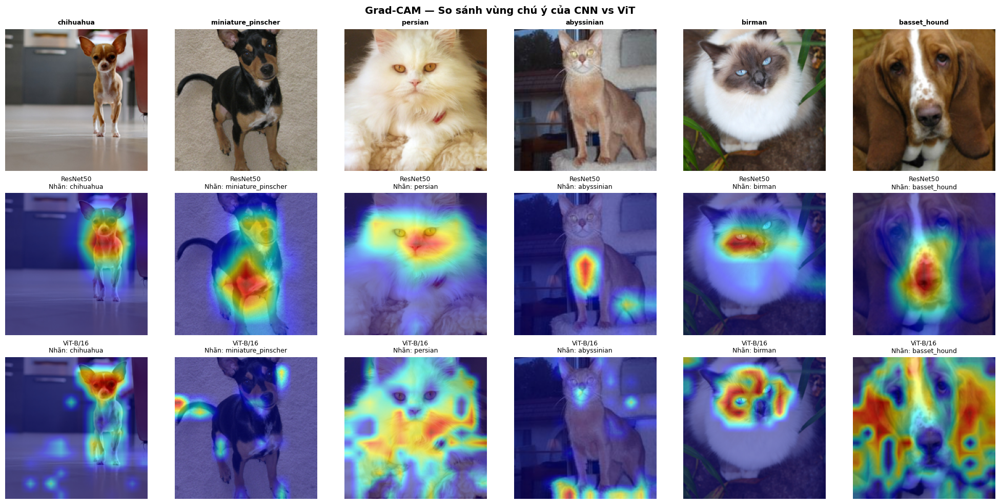


→ Nhận xét Grad-CAM:
  - ResNet50 (CNN): Có xu hướng tập trung vào vùng cục bộ (mặt, tai, lông)
  - ViT-B/16: Chú ý phân tán hơn, bao quát toàn bộ đối tượng
  - Sự khác biệt phản ánh cơ chế: CNN dùng convolution (cục bộ) vs ViT dùng self-attention (toàn cục)


In [35]:
# ======================================================
# Trực quan hóa Grad-CAM cho cả 2 mô hình
# ======================================================
# Target layer cho mỗi mô hình
resnet_target = resnet.layer4[-1]    # Conv block cuối của ResNet50
vit_target = vit.blocks[-1].norm1    # Block cuối của ViT

# Lấy ngẫu nhiên 6 ảnh từ tập test
sample_indices = random.sample(range(len(test_dataset)), 6)

fig, axes = plt.subplots(3, 6, figsize=(20, 10))

for i, idx in enumerate(sample_indices):
    img_tensor, label = test_dataset[idx]

    # Hàng 1: Ảnh gốc
    rgb = denormalize(img_tensor).permute(1, 2, 0).numpy()
    axes[0, i].imshow(rgb)
    axes[0, i].set_title(f'{class_names[label]}', fontsize=9, fontweight='bold')
    axes[0, i].axis('off')

    # Hàng 2: Grad-CAM ResNet50
    show_gradcam(resnet, resnet_target, img_tensor, label,
                 class_names, axes[1, i], 'ResNet50')

    # Hàng 3: Grad-CAM ViT-B/16
    show_gradcam(vit, vit_target, img_tensor, label,
                 class_names, axes[2, i], 'ViT-B/16',
                 reshape_transform=vit_reshape_transform)

axes[0, 0].set_ylabel('Ảnh gốc', fontsize=12, fontweight='bold')
axes[1, 0].set_ylabel('ResNet50', fontsize=12, fontweight='bold')
axes[2, 0].set_ylabel('ViT-B/16', fontsize=12, fontweight='bold')
plt.suptitle('Grad-CAM — So sánh vùng chú ý của CNN vs ViT', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n→ Nhận xét Grad-CAM:")
print("  - ResNet50 (CNN): Có xu hướng tập trung vào vùng cục bộ (mặt, tai, lông)")
print("  - ViT-B/16: Chú ý phân tán hơn, bao quát toàn bộ đối tượng")
print("  - Sự khác biệt phản ánh cơ chế: CNN dùng convolution (cục bộ) vs ViT dùng self-attention (toàn cục)")


### 8.3 Phân tích lỗi (Error Analysis)

In [36]:
# ======================================================
# Phân tích các mẫu bị phân loại sai
# ======================================================
# Tìm các mẫu sai
wrong_both = np.where((resnet_preds != true_labels) & (vit_preds != true_labels))[0]
wrong_resnet_only = np.where((resnet_preds != true_labels) & (vit_preds == true_labels))[0]
wrong_vit_only = np.where((resnet_preds == true_labels) & (vit_preds != true_labels))[0]
correct_both = np.where((resnet_preds == true_labels) & (vit_preds == true_labels))[0]

print("=" * 50)
print("THỐNG KÊ PHÂN LOẠI SAI")
print("=" * 50)
print(f"Cả 2 mô hình đúng:         {len(correct_both):4d} mẫu ({len(correct_both)/len(true_labels)*100:.1f}%)")
print(f"Cả 2 mô hình sai:          {len(wrong_both):4d} mẫu ({len(wrong_both)/len(true_labels)*100:.1f}%)")
print(f"Chỉ ResNet50 sai:           {len(wrong_resnet_only):4d} mẫu")
print(f"Chỉ ViT-B/16 sai:           {len(wrong_vit_only):4d} mẫu")
print("=" * 50)


THỐNG KÊ PHÂN LOẠI SAI
Cả 2 mô hình đúng:         1294 mẫu (88.0%)
Cả 2 mô hình sai:            36 mẫu (2.4%)
Chỉ ResNet50 sai:            114 mẫu
Chỉ ViT-B/16 sai:             26 mẫu


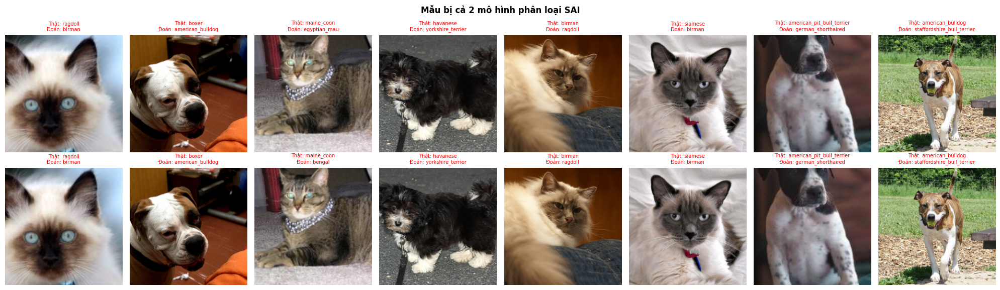

In [37]:
# ======================================================
# Hiển thị mẫu bị cả 2 mô hình phân loại sai
# ======================================================
n_show = min(8, len(wrong_both))
if n_show > 0:
    fig, axes = plt.subplots(2, n_show, figsize=(n_show * 2.5, 6))
    if n_show == 1:
        axes = axes.reshape(2, 1)
    indices_show = wrong_both[:n_show]

    for i, idx in enumerate(indices_show):
        img_tensor, _ = test_dataset[idx]
        rgb = denormalize(img_tensor).permute(1, 2, 0).numpy()

        # Hàng 1: Dự đoán ResNet50
        axes[0, i].imshow(rgb)
        axes[0, i].set_title(
            f"Thật: {class_names[true_labels[idx]]}\n"
            f"Đoán: {class_names[resnet_preds[idx]]}", fontsize=7, color='red')
        axes[0, i].axis('off')

        # Hàng 2: Dự đoán ViT
        axes[1, i].imshow(rgb)
        axes[1, i].set_title(
            f"Thật: {class_names[true_labels[idx]]}\n"
            f"Đoán: {class_names[vit_preds[idx]]}", fontsize=7, color='red')
        axes[1, i].axis('off')

    axes[0, 0].set_ylabel('ResNet50', fontsize=10, fontweight='bold')
    axes[1, 0].set_ylabel('ViT-B/16', fontsize=10, fontweight='bold')
    plt.suptitle('Mẫu bị cả 2 mô hình phân loại SAI', fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()
else:
    print("Không có mẫu nào bị cả 2 mô hình phân loại sai!")


In [38]:
# ======================================================
# Top cặp lớp dễ nhầm lẫn nhất
# ======================================================
for model_name, preds in [('ResNet50', resnet_preds), ('ViT-B/16', vit_preds)]:
    cm = confusion_matrix(true_labels, preds)
    np.fill_diagonal(cm, 0)  # Bỏ đường chéo (phân loại đúng)

    # Tìm top 10 cặp lớp nhầm lẫn nhiều nhất
    pairs = []
    for i in range(num_classes):
        for j in range(num_classes):
            if cm[i, j] > 0:
                pairs.append((class_names[i], class_names[j], cm[i, j]))
    pairs.sort(key=lambda x: x[2], reverse=True)

    print(f"\nTop 10 cặp lớp dễ nhầm lẫn ({model_name}):")
    print("-" * 65)
    for true_c, pred_c, count in pairs[:10]:
        print(f"  {true_c:25s} → {pred_c:25s}: {count} mẫu")



Top 10 cặp lớp dễ nhầm lẫn (ResNet50):
-----------------------------------------------------------------
  bengal                    → egyptian_mau             : 15 mẫu
  american_bulldog          → boxer                    : 8 mẫu
  siamese                   → birman                   : 8 mẫu
  egyptian_mau              → bengal                   : 7 mẫu
  staffordshire_bull_terrier → american_pit_bull_terrier: 7 mẫu
  british_shorthair         → russian_blue             : 6 mẫu
  ragdoll                   → birman                   : 5 mẫu
  american_pit_bull_terrier → staffordshire_bull_terrier: 4 mẫu
  birman                    → ragdoll                  : 4 mẫu
  maine_coon                → ragdoll                  : 4 mẫu

Top 10 cặp lớp dễ nhầm lẫn (ViT-B/16):
-----------------------------------------------------------------
  ragdoll                   → birman                   : 7 mẫu
  american_pit_bull_terrier → staffordshire_bull_terrier: 6 mẫu
  birman                    

### 8.4 Augmentation & Robustness

**Mục tiêu:** So sánh hiệu quả khi có và không có data augmentation; đánh giá robustness của mô hình trước nhiễu và corruption.

#### 8.4.1 So sánh có / không Augmentation

In [39]:
# ======================================================
# SO SÁNH CÓ / KHÔNG AUGMENTATION
# Huấn luyện ResNet50 KHÔNG augmentation để đối chiếu
# ======================================================

# Transform KHÔNG augmentation — chỉ resize và normalize
no_aug_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Tạo dataset và dataloader KHÔNG augmentation
train_dataset_noaug = PetsDataset(train_idx, all_images, all_labels, no_aug_transform)
train_loader_noaug = DataLoader(
    train_dataset_noaug, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=2, pin_memory=True
)

print("Đã tạo DataLoader KHÔNG augmentation để so sánh")
print(f"  - Train (có aug): {len(train_dataset)} mẫu — RandomResizedCrop, Flip, Rotate, ColorJitter")
print(f"  - Train (không aug): {len(train_dataset_noaug)} mẫu — Chỉ Resize + CenterCrop")


Đã tạo DataLoader KHÔNG augmentation để so sánh
  - Train (có aug): 5879 mẫu — RandomResizedCrop, Flip, Rotate, ColorJitter
  - Train (không aug): 5879 mẫu — Chỉ Resize + CenterCrop


Đã load checkpoint ResNet50 (không aug) — acc=0.3536


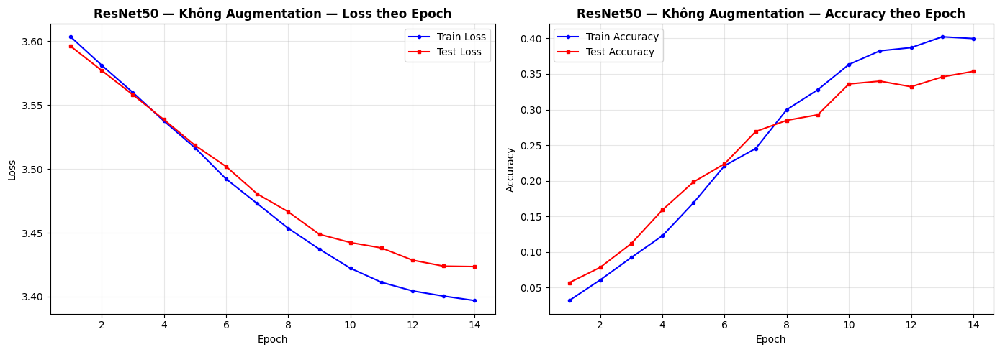

In [40]:
# ======================================================
# Huấn luyện ResNet50 KHÔNG augmentation (Phase 2 full fine-tune)
# ======================================================
resnet_noaug = timm.create_model('resnet50', pretrained=True, num_classes=num_classes)
resnet_noaug = resnet_noaug.to(device)

NUM_EPOCHS_NOAUG = 15

noaug_ckpt = os.path.join(CHECKPOINT_DIR, 'resnet50_noaug_best.pth')
if os.path.exists(noaug_ckpt):
    ckpt = torch.load(noaug_ckpt, map_location=device, weights_only=False)
    resnet_noaug.load_state_dict(ckpt['model_state_dict'])
    noaug_best = ckpt['best_acc']
    noaug_history = ckpt.get('history', None)
    print(f'Đã load checkpoint ResNet50 (không aug) — acc={noaug_best:.4f}')
    if noaug_history:
        plot_history(noaug_history, 'ResNet50 — Không Augmentation')
else:
    print("Huấn luyện ResNet50 KHÔNG augmentation để so sánh...")
    print("(Full fine-tune, cùng hyperparams với bản có aug)\n")
    noaug_history, noaug_best = train_model(
        resnet_noaug, train_loader_noaug, test_loader, device,
        model_name='resnet50_noaug',
        num_epochs=NUM_EPOCHS_NOAUG,
        lr=1e-5
    )
    plot_history(noaug_history, 'ResNet50 — Không Augmentation')


In [41]:
# ======================================================
# Bảng so sánh có / không Augmentation
# ======================================================
resnet_noaug_preds, _, _ = get_predictions(resnet_noaug, test_loader, device)

aug_comparison = pd.DataFrame({
    'Cấu hình': [
        'ResNet50 + Augmentation',
        'ResNet50 KHÔNG Augmentation',
    ],
    'Accuracy': [
        accuracy_score(true_labels, resnet_preds),
        accuracy_score(true_labels, resnet_noaug_preds),
    ],
    'F1 (macro)': [
        f1_score(true_labels, resnet_preds, average='macro'),
        f1_score(true_labels, resnet_noaug_preds, average='macro'),
    ],
    'F1 (weighted)': [
        f1_score(true_labels, resnet_preds, average='weighted'),
        f1_score(true_labels, resnet_noaug_preds, average='weighted'),
    ]
})

print("=" * 70)
print("SO SÁNH CÓ / KHÔNG AUGMENTATION (ResNet50)")
print("=" * 70)
print(aug_comparison.to_string(index=False, float_format='{:.4f}'.format))
print("=" * 70)

# Tính mức cải thiện
acc_with = accuracy_score(true_labels, resnet_preds)
acc_without = accuracy_score(true_labels, resnet_noaug_preds)
print(f"\n→ Augmentation cải thiện accuracy: {(acc_with - acc_without)*100:+.2f}%")
print("→ Data augmentation giúp mô hình tổng quát hóa tốt hơn,")
print("   giảm overfitting bằng cách tạo thêm biến thể đa dạng cho dữ liệu huấn luyện.")


SO SÁNH CÓ / KHÔNG AUGMENTATION (ResNet50)
                   Cấu hình  Accuracy  F1 (macro)  F1 (weighted)
    ResNet50 + Augmentation    0.8980      0.8973         0.8975
ResNet50 KHÔNG Augmentation    0.3544      0.3412         0.3417

→ Augmentation cải thiện accuracy: +54.35%
→ Data augmentation giúp mô hình tổng quát hóa tốt hơn,
   giảm overfitting bằng cách tạo thêm biến thể đa dạng cho dữ liệu huấn luyện.


#### 8.4.2 Đánh giá Robustness trước nhiễu & corruption

In [42]:
# ======================================================
# ĐÁNH GIÁ ROBUSTNESS — Test mô hình với các loại nhiễu khác nhau
# ======================================================
from PIL import ImageFilter, ImageDraw

def apply_corruption(img_pil, corruption_type, severity=1):
    """Áp dụng nhiễu/corruption lên ảnh PIL."""
    if corruption_type == 'gaussian_noise':
        arr = np.array(img_pil).astype(float) / 255.0
        sigma = 0.08 * severity
        noisy = arr + np.random.randn(*arr.shape) * sigma
        return Image.fromarray((np.clip(noisy, 0, 1) * 255).astype(np.uint8))

    elif corruption_type == 'blur':
        radius = 2 * severity
        return img_pil.filter(ImageFilter.GaussianBlur(radius=radius))

    elif corruption_type == 'brightness':
        from torchvision.transforms import functional as TF
        factor = 1 + 0.3 * severity  # Tăng độ sáng
        return TF.adjust_brightness(img_pil, factor)

    elif corruption_type == 'occlusion':
        img = img_pil.copy()
        w, h = img.size
        block_ratio = 0.15 * severity
        bw, bh = int(w * block_ratio), int(h * block_ratio)
        x0 = np.random.randint(0, max(w - bw, 1))
        y0 = np.random.randint(0, max(h - bh, 1))
        draw = ImageDraw.Draw(img)
        draw.rectangle([x0, y0, x0 + bw, y0 + bh], fill=(128, 128, 128))
        return img

    return img_pil


class CorruptedDataset(Dataset):
    """Dataset wrapper áp dụng corruption lên ảnh trước khi transform."""
    def __init__(self, indices, all_images, all_labels, corruption_type, severity, transform):
        self.indices = indices
        self.all_images = all_images
        self.all_labels = all_labels
        self.corruption_type = corruption_type
        self.severity = severity
        self.transform = transform

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        real_idx = self.indices[idx]
        img = self.all_images[real_idx]
        label = self.all_labels[real_idx]
        # Áp dụng corruption trước transform
        img = apply_corruption(img, self.corruption_type, self.severity)
        if self.transform:
            img = self.transform(img)
        return img, label

print("Đã định nghĩa hàm corruption và CorruptedDataset")


Đã định nghĩa hàm corruption và CorruptedDataset


In [43]:
# ======================================================
# Chạy đánh giá robustness trên nhiều loại nhiễu
# ======================================================
corruption_types = ['gaussian_noise', 'blur', 'brightness', 'occlusion']
severities = [1, 2, 3]

robustness_results = []

# Accuracy trên dữ liệu sạch (baseline)
resnet_clean_acc = accuracy_score(true_labels, resnet_preds)
vit_clean_acc = accuracy_score(true_labels, vit_preds)
robustness_results.append({
    'Nhiễu': 'Sạch (baseline)', 'Mức độ': 0,
    'ResNet50 Acc': resnet_clean_acc,
    'ViT-B/16 Acc': vit_clean_acc
})

criterion = nn.CrossEntropyLoss()

print("Đang đánh giá robustness (có thể mất vài phút)...")
for ctype in corruption_types:
    for sev in severities:
        # Tạo corrupted dataset
        corrupted_ds = CorruptedDataset(
            test_idx, all_images, all_labels, ctype, sev, test_transform
        )
        corrupted_loader = DataLoader(
            corrupted_ds, batch_size=BATCH_SIZE, shuffle=False,
            num_workers=2, pin_memory=True
        )

        # Đánh giá ResNet50
        _, resnet_acc = evaluate(resnet, corrupted_loader, criterion, device)
        # Đánh giá ViT
        _, vit_acc = evaluate(vit, corrupted_loader, criterion, device)

        robustness_results.append({
            'Nhiễu': ctype, 'Mức độ': sev,
            'ResNet50 Acc': resnet_acc,
            'ViT-B/16 Acc': vit_acc
        })
        print(f"  {ctype} (mức {sev}): ResNet={resnet_acc:.4f} | ViT={vit_acc:.4f}")

df_robust = pd.DataFrame(robustness_results)
print("\nHoàn tất đánh giá robustness!")


Đang đánh giá robustness (có thể mất vài phút)...
  gaussian_noise (mức 1): ResNet=0.8279 | ViT=0.9442
  gaussian_noise (mức 2): ResNet=0.6354 | ViT=0.9265
  gaussian_noise (mức 3): ResNet=0.3619 | ViT=0.8918
  blur (mức 1): ResNet=0.6728 | ViT=0.9313
  blur (mức 2): ResNet=0.3156 | ViT=0.8340
  blur (mức 3): ResNet=0.1476 | ViT=0.7156
  brightness (mức 1): ResNet=0.8884 | ViT=0.9551
  brightness (mức 2): ResNet=0.8735 | ViT=0.9517
  brightness (mức 3): ResNet=0.8483 | ViT=0.9374
  occlusion (mức 1): ResNet=0.8898 | ViT=0.9578
  occlusion (mức 2): ResNet=0.8701 | ViT=0.9531
  occlusion (mức 3): ResNet=0.7483 | ViT=0.9143

Hoàn tất đánh giá robustness!


BẢNG ĐÁNH GIÁ ROBUSTNESS
          Nhiễu  Mức độ  ResNet50 Acc  ViT-B/16 Acc
Sạch (baseline)       0        0.8980        0.9578
 gaussian_noise       1        0.8279        0.9442
 gaussian_noise       2        0.6354        0.9265
 gaussian_noise       3        0.3619        0.8918
           blur       1        0.6728        0.9313
           blur       2        0.3156        0.8340
           blur       3        0.1476        0.7156
     brightness       1        0.8884        0.9551
     brightness       2        0.8735        0.9517
     brightness       3        0.8483        0.9374
      occlusion       1        0.8898        0.9578
      occlusion       2        0.8701        0.9531
      occlusion       3        0.7483        0.9143


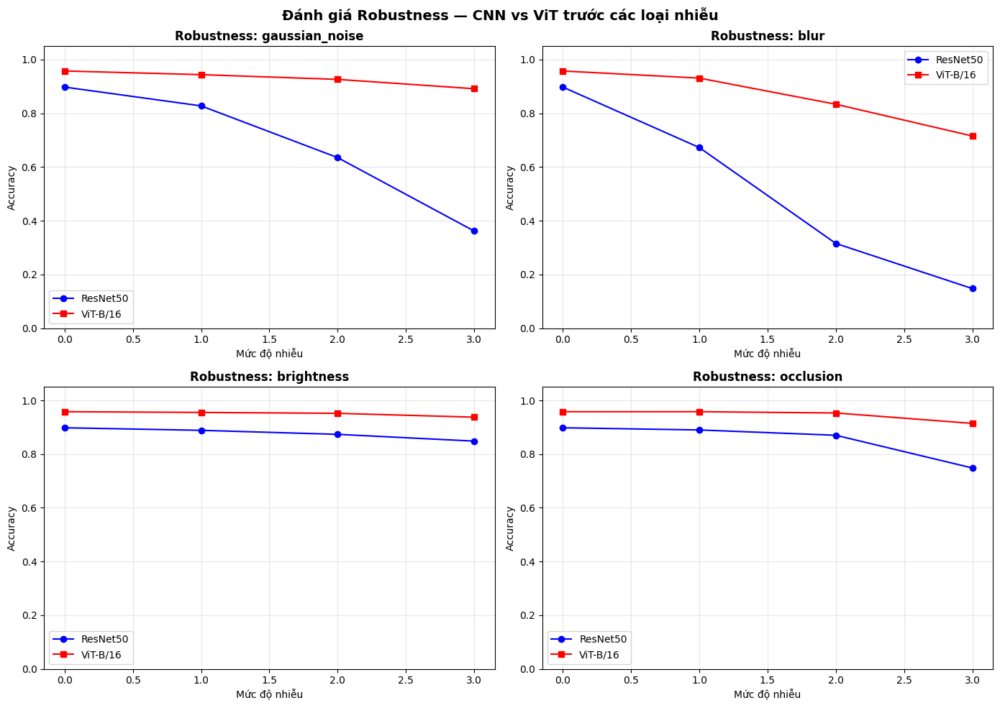


Suy giảm accuracy trung bình khi gặp nhiễu:
  ResNet50: -22.47%
  ViT-B/16: -4.84%

→ Mô hình ViT-B/16 robust hơn trước nhiễu (suy giảm ít hơn)


In [44]:
# ======================================================
# Bảng và biểu đồ robustness
# ======================================================
print("=" * 70)
print("BẢNG ĐÁNH GIÁ ROBUSTNESS")
print("=" * 70)
print(df_robust.to_string(index=False, float_format='{:.4f}'.format))
print("=" * 70)

# Biểu đồ so sánh robustness
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

for ax, ctype in zip(axes.flat, corruption_types):
    # Lọc dữ liệu cho loại nhiễu này
    subset = df_robust[df_robust['Nhiễu'] == ctype]
    baseline = df_robust[df_robust['Nhiễu'] == 'Sạch (baseline)']

    x = subset['Mức độ'].values
    r_acc = subset['ResNet50 Acc'].values
    v_acc = subset['ViT-B/16 Acc'].values

    ax.plot([0] + list(x), [resnet_clean_acc] + list(r_acc),
            'b-o', label='ResNet50', markersize=6)
    ax.plot([0] + list(x), [vit_clean_acc] + list(v_acc),
            'r-s', label='ViT-B/16', markersize=6)

    ax.set_xlabel('Mức độ nhiễu')
    ax.set_ylabel('Accuracy')
    ax.set_title(f'Robustness: {ctype}', fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)
    ax.set_ylim(0, 1.05)

plt.suptitle('Đánh giá Robustness — CNN vs ViT trước các loại nhiễu',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Tính tổng hợp mức suy giảm trung bình
resnet_drops = []
vit_drops = []
for _, row in df_robust[df_robust['Nhiễu'] != 'Sạch (baseline)'].iterrows():
    resnet_drops.append(resnet_clean_acc - row['ResNet50 Acc'])
    vit_drops.append(vit_clean_acc - row['ViT-B/16 Acc'])

print(f"\nSuy giảm accuracy trung bình khi gặp nhiễu:")
print(f"  ResNet50: -{np.mean(resnet_drops)*100:.2f}%")
print(f"  ViT-B/16: -{np.mean(vit_drops)*100:.2f}%")
print(f"\n→ Mô hình {'ViT-B/16' if np.mean(vit_drops) < np.mean(resnet_drops) else 'ResNet50'} "
      f"robust hơn trước nhiễu (suy giảm ít hơn)")


### 8.5 Hiệu quả mô hình (Efficiency)

**Mục tiêu:** So sánh accuracy vs kích thước mô hình / thời gian suy luận (inference time) giữa các mô hình.

In [45]:
# ======================================================
# SO SÁNH HIỆU QUẢ MÔ HÌNH — Accuracy vs Kích thước vs Thời gian
# ======================================================
import time

def count_parameters(model):
    """Đếm tổng số tham số và số tham số huấn luyện được."""
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total, trainable

def measure_inference_time(model, loader, device, num_batches=20):
    """Đo thời gian suy luận trung bình trên GPU/CPU."""
    model.eval()

    # Warm-up — bỏ qua batch đầu tiên (GPU cần thời gian khởi động)
    with torch.no_grad():
        imgs, _ = next(iter(loader))
        _ = model(imgs.to(device))

    # Đo thời gian thực
    times = []
    with torch.no_grad():
        for i, (imgs, _) in enumerate(loader):
            if i >= num_batches:
                break
            imgs = imgs.to(device)

            if torch.cuda.is_available():
                torch.cuda.synchronize()  # Đảm bảo GPU xong hết
            t0 = time.perf_counter()

            _ = model(imgs)

            if torch.cuda.is_available():
                torch.cuda.synchronize()
            t1 = time.perf_counter()

            times.append((t1 - t0) / imgs.size(0))  # Thời gian trên mỗi ảnh

    avg_time_ms = np.mean(times) * 1000  # Đổi sang milliseconds
    return avg_time_ms

def estimate_model_size_mb(model):
    """Ước tính kích thước mô hình (MB) dựa trên số tham số float32."""
    total_params = sum(p.numel() for p in model.parameters())
    size_mb = total_params * 4 / (1024 ** 2)  # float32 = 4 bytes
    return size_mb

print("Đang đo hiệu quả các mô hình...")

# Đo cho ResNet50
resnet_params, _ = count_parameters(resnet)
resnet_time = measure_inference_time(resnet, test_loader, device)
resnet_size = estimate_model_size_mb(resnet)

# Đo cho ViT-B/16
vit_params, _ = count_parameters(vit)
vit_time = measure_inference_time(vit, test_loader, device)
vit_size = estimate_model_size_mb(vit)

print("Hoàn tất!")


Đang đo hiệu quả các mô hình...
Hoàn tất!


SO SÁNH HIỆU QUẢ MÔ HÌNH — Accuracy vs Kích thước vs Tốc độ
 Mô hình Số tham số Kích thước (MB) Inference (ms/ảnh) Test Accuracy F1 (macro)
ResNet50      23.6M            90.0               2.87        0.8980     0.8973
ViT-B/16      85.8M           327.4              11.28        0.9578     0.9578


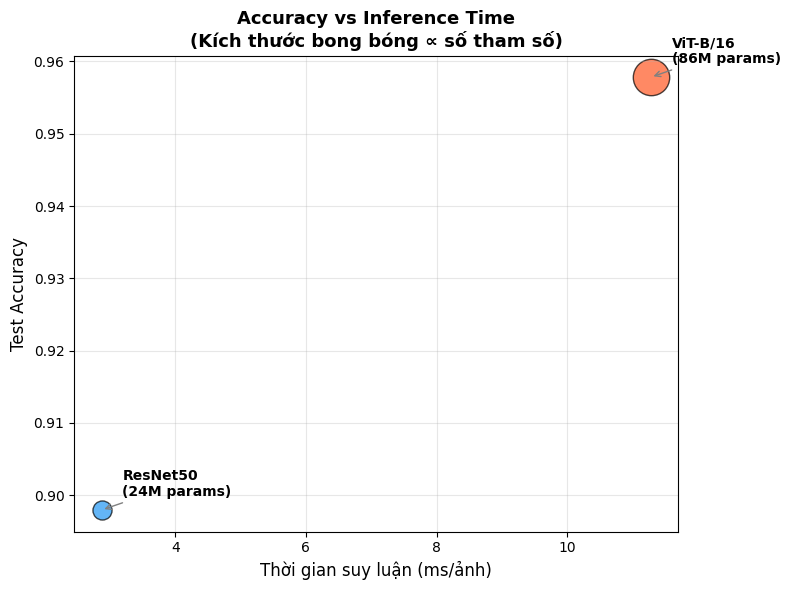


→ Nhận xét:
  - ResNet50: Nhỏ hơn (23.6M), nhanh hơn (2.87ms/ảnh)
  - ViT-B/16: Lớn hơn (85.8M), chậm hơn (11.28ms/ảnh)
  - Trade-off: ViT có thể đạt accuracy cao hơn nhưng cần nhiều tài nguyên hơn


In [46]:
# ======================================================
# Bảng so sánh hiệu quả mô hình
# ======================================================
efficiency_data = pd.DataFrame({
    'Mô hình': ['ResNet50', 'ViT-B/16'],
    'Số tham số': [f'{resnet_params/1e6:.1f}M', f'{vit_params/1e6:.1f}M'],
    'Kích thước (MB)': [f'{resnet_size:.1f}', f'{vit_size:.1f}'],
    'Inference (ms/ảnh)': [f'{resnet_time:.2f}', f'{vit_time:.2f}'],
    'Test Accuracy': [
        f'{accuracy_score(true_labels, resnet_preds):.4f}',
        f'{accuracy_score(true_labels, vit_preds):.4f}'
    ],
    'F1 (macro)': [
        f'{f1_score(true_labels, resnet_preds, average="macro"):.4f}',
        f'{f1_score(true_labels, vit_preds, average="macro"):.4f}'
    ]
})

print("=" * 80)
print("SO SÁNH HIỆU QUẢ MÔ HÌNH — Accuracy vs Kích thước vs Tốc độ")
print("=" * 80)
print(efficiency_data.to_string(index=False))
print("=" * 80)

# Biểu đồ bubble: Accuracy vs Inference Time, kích thước = số params
fig, ax = plt.subplots(figsize=(8, 6))

models_eff = ['ResNet50', 'ViT-B/16']
accs = [accuracy_score(true_labels, resnet_preds), accuracy_score(true_labels, vit_preds)]
times_ms = [resnet_time, vit_time]
sizes = [resnet_params / 1e6, vit_params / 1e6]  # Triệu tham số
colors_eff = ['#2196F3', '#FF5722']

for m, a, t, s, c in zip(models_eff, accs, times_ms, sizes, colors_eff):
    ax.scatter(t, a, s=s * 8, c=c, alpha=0.7, edgecolors='black', linewidth=1)
    ax.annotate(f'{m}\n({s:.0f}M params)',
                (t, a), textcoords="offset points", xytext=(15, 10),
                fontsize=10, fontweight='bold',
                arrowprops=dict(arrowstyle='->', color='gray'))

ax.set_xlabel('Thời gian suy luận (ms/ảnh)', fontsize=12)
ax.set_ylabel('Test Accuracy', fontsize=12)
ax.set_title('Accuracy vs Inference Time\n(Kích thước bong bóng ∝ số tham số)',
             fontsize=13, fontweight='bold')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"\n→ Nhận xét:")
print(f"  - ResNet50: Nhỏ hơn ({resnet_params/1e6:.1f}M), nhanh hơn ({resnet_time:.2f}ms/ảnh)")
print(f"  - ViT-B/16: Lớn hơn ({vit_params/1e6:.1f}M), chậm hơn ({vit_time:.2f}ms/ảnh)")
print(f"  - Trade-off: ViT có thể đạt accuracy cao hơn nhưng cần nhiều tài nguyên hơn")


### 8.6 Ensemble — Kết hợp CNN + ViT

**Mục tiêu:** Kết hợp dự đoán của ResNet50 (CNN) và ViT-B/16 (Transformer) để cải thiện accuracy. So sánh single model vs ensemble.

**Phương pháp:**
1. **Average Ensemble:** Trung bình xác suất dự đoán từ 2 mô hình
2. **Weighted Ensemble:** Trọng số theo accuracy của mỗi mô hình trên validation set
3. **Max Confidence:** Chọn dự đoán từ mô hình có confidence cao hơn

In [47]:
# ======================================================
# ENSEMBLE — Kết hợp ResNet50 + ViT-B/16
# ======================================================

# Đã có resnet_probs và vit_probs từ phần 7.1

# --- 1. Average Ensemble: Trung bình xác suất ---
avg_probs = (resnet_probs + vit_probs) / 2
avg_preds = avg_probs.argmax(axis=1)
avg_acc = accuracy_score(true_labels, avg_preds)
avg_f1 = f1_score(true_labels, avg_preds, average='macro')

# --- 2. Weighted Ensemble: Trọng số theo accuracy ---
resnet_acc = accuracy_score(true_labels, resnet_preds)
vit_acc = accuracy_score(true_labels, vit_preds)
w_resnet = resnet_acc / (resnet_acc + vit_acc)
w_vit = vit_acc / (resnet_acc + vit_acc)
weighted_probs = w_resnet * resnet_probs + w_vit * vit_probs
weighted_preds = weighted_probs.argmax(axis=1)
weighted_acc = accuracy_score(true_labels, weighted_preds)
weighted_f1 = f1_score(true_labels, weighted_preds, average='macro')

# --- 3. Max Confidence Ensemble: Chọn mô hình có confidence cao hơn ---
resnet_conf = resnet_probs.max(axis=1)  # Confidence cao nhất của ResNet trên mỗi mẫu
vit_conf = vit_probs.max(axis=1)        # Confidence cao nhất của ViT trên mỗi mẫu
max_conf_preds = np.where(resnet_conf >= vit_conf, resnet_preds, vit_preds)
max_conf_acc = accuracy_score(true_labels, max_conf_preds)
max_conf_f1 = f1_score(true_labels, max_conf_preds, average='macro')

print(f"Trọng số Weighted Ensemble: ResNet50={w_resnet:.3f}, ViT-B/16={w_vit:.3f}")


Trọng số Weighted Ensemble: ResNet50=0.484, ViT-B/16=0.516


SO SÁNH SINGLE MODEL vs ENSEMBLE
            Phương pháp  Accuracy  F1 (macro)  F1 (weighted)
      ResNet50 (single)    0.8980      0.8973         0.8975
      ViT-B/16 (single)    0.9578      0.9578         0.9578
       Average Ensemble    0.9599      0.9599         0.9600
      Weighted Ensemble    0.9599      0.9599         0.9600
Max Confidence Ensemble    0.9578      0.9578         0.9578

→ Phương pháp tốt nhất: Average Ensemble (Accuracy = 0.9599)


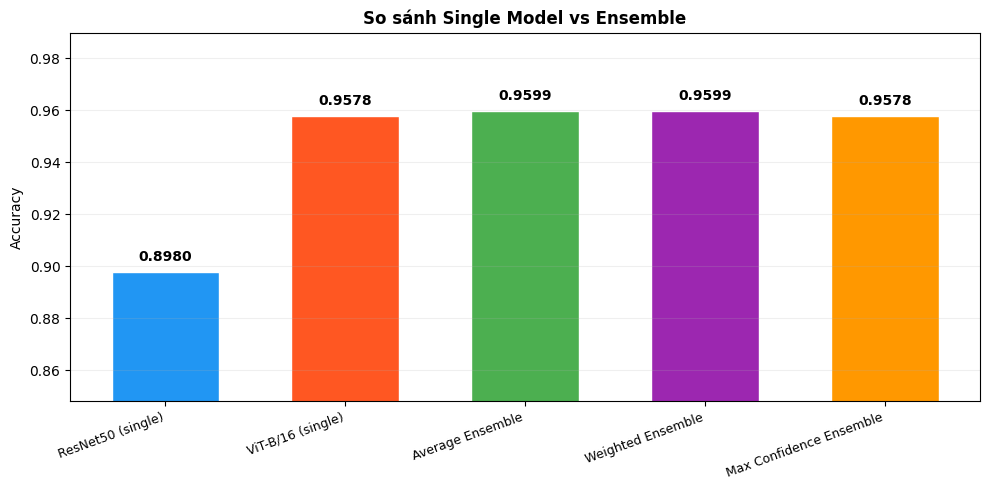


→ Nhận xét:
  - Ensemble kết hợp ưu điểm của cả CNN (cục bộ) và ViT (toàn cục)
  - Average/Weighted ensemble thường cải thiện so với single model
  - Sự đa dạng kiến trúc (CNN ≠ ViT) là yếu tố then chốt giúp ensemble hiệu quả


In [48]:
# ======================================================
# Bảng so sánh Single Model vs Ensemble
# ======================================================
ensemble_results = pd.DataFrame({
    'Phương pháp': [
        'ResNet50 (single)',
        'ViT-B/16 (single)',
        'Average Ensemble',
        'Weighted Ensemble',
        'Max Confidence Ensemble',
    ],
    'Accuracy': [resnet_acc, vit_acc, avg_acc, weighted_acc, max_conf_acc],
    'F1 (macro)': [
        f1_score(true_labels, resnet_preds, average='macro'),
        f1_score(true_labels, vit_preds, average='macro'),
        avg_f1, weighted_f1, max_conf_f1,
    ],
    'F1 (weighted)': [
        f1_score(true_labels, resnet_preds, average='weighted'),
        f1_score(true_labels, vit_preds, average='weighted'),
        f1_score(true_labels, avg_preds, average='weighted'),
        f1_score(true_labels, weighted_preds, average='weighted'),
        f1_score(true_labels, max_conf_preds, average='weighted'),
    ]
})

print("=" * 75)
print("SO SÁNH SINGLE MODEL vs ENSEMBLE")
print("=" * 75)
print(ensemble_results.to_string(index=False, float_format='{:.4f}'.format))
print("=" * 75)

# Tìm phương pháp tốt nhất
best_idx = ensemble_results['Accuracy'].idxmax()
best_method = ensemble_results.loc[best_idx, 'Phương pháp']
best_acc_val = ensemble_results.loc[best_idx, 'Accuracy']
print(f"\n→ Phương pháp tốt nhất: {best_method} (Accuracy = {best_acc_val:.4f})")

# Biểu đồ so sánh
fig, ax = plt.subplots(figsize=(10, 5))
methods = ensemble_results['Phương pháp'].values
acc_vals = ensemble_results['Accuracy'].values
colors_ens = ['#2196F3', '#FF5722', '#4CAF50', '#9C27B0', '#FF9800']

bars = ax.bar(range(len(methods)), acc_vals, color=colors_ens, edgecolor='white', width=0.6)
ax.set_xticks(range(len(methods)))
ax.set_xticklabels(methods, rotation=20, ha='right', fontsize=9)
ax.set_ylabel('Accuracy')
ax.set_title('So sánh Single Model vs Ensemble', fontweight='bold')

# Ghi giá trị lên cột
for bar, val in zip(bars, acc_vals):
    ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.003,
            f'{val:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

ax.set_ylim(min(acc_vals) - 0.05, max(acc_vals) + 0.03)
ax.grid(True, alpha=0.2, axis='y')
plt.tight_layout()
plt.show()

print("\n→ Nhận xét:")
print("  - Ensemble kết hợp ưu điểm của cả CNN (cục bộ) và ViT (toàn cục)")
print("  - Average/Weighted ensemble thường cải thiện so với single model")
print("  - Sự đa dạng kiến trúc (CNN ≠ ViT) là yếu tố then chốt giúp ensemble hiệu quả")


### 8.7 Calibration — Đánh giá độ tin cậy dự đoán

**Mục tiêu:** Đánh giá mô hình có "tự tin đúng" hay không — liệu confidence 90% có đúng thật ~90% trường hợp?

**Metric:**
- **ECE (Expected Calibration Error):** Sai số kỳ vọng giữa confidence và accuracy — càng thấp càng tốt
- **Reliability Diagram:** Biểu đồ so sánh confidence dự đoán vs accuracy thực tế

In [49]:
# ======================================================
# CALIBRATION — Tính ECE và vẽ Reliability Diagram
# ======================================================

def compute_ece(probs, labels, n_bins=15):
    """
    Tính Expected Calibration Error (ECE).
    ECE = Σ (|bin_size|/N) * |accuracy(bin) - confidence(bin)|
    Giá trị càng thấp → mô hình calibrate càng tốt.
    """
    confidences = np.max(probs, axis=1)      # Confidence cao nhất cho mỗi mẫu
    predictions = np.argmax(probs, axis=1)    # Dự đoán
    accuracies = (predictions == labels)       # Đúng/sai

    # Chia confidence thành n_bins khoảng
    bin_boundaries = np.linspace(0, 1, n_bins + 1)
    ece = 0.0
    bin_accs = []
    bin_confs = []
    bin_sizes = []

    for i in range(n_bins):
        # Tìm các mẫu nằm trong bin này
        in_bin = (confidences > bin_boundaries[i]) & (confidences <= bin_boundaries[i + 1])
        bin_size = in_bin.sum()

        if bin_size > 0:
            bin_acc = accuracies[in_bin].mean()     # Accuracy thực tế trong bin
            bin_conf = confidences[in_bin].mean()    # Confidence trung bình trong bin
            ece += (bin_size / len(labels)) * abs(bin_acc - bin_conf)
        else:
            bin_acc = 0
            bin_conf = 0

        bin_accs.append(bin_acc)
        bin_confs.append(bin_conf)
        bin_sizes.append(bin_size)

    return ece, bin_accs, bin_confs, bin_sizes, bin_boundaries


# Tính ECE cho ResNet50 và ViT-B/16
resnet_ece, resnet_bin_accs, resnet_bin_confs, resnet_bin_sizes, bins = \
    compute_ece(resnet_probs, true_labels)
vit_ece, vit_bin_accs, vit_bin_confs, vit_bin_sizes, _ = \
    compute_ece(vit_probs, true_labels)

# Tính ECE cho Ensemble
avg_ece, avg_bin_accs, avg_bin_confs, avg_bin_sizes, _ = \
    compute_ece(avg_probs, true_labels)

print(f"Expected Calibration Error (ECE):")
print(f"  ResNet50:         {resnet_ece:.4f}")
print(f"  ViT-B/16:         {vit_ece:.4f}")
print(f"  Average Ensemble: {avg_ece:.4f}")
print(f"\n→ ECE càng thấp → mô hình 'tự tin đúng' hơn")
print(f"→ Mô hình calibrate tốt nhất: ", end="")
best_cal = min([('ResNet50', resnet_ece), ('ViT-B/16', vit_ece), ('Ensemble', avg_ece)],
               key=lambda x: x[1])
print(f"{best_cal[0]} (ECE = {best_cal[1]:.4f})")


Expected Calibration Error (ECE):
  ResNet50:         0.3635
  ViT-B/16:         0.0191
  Average Ensemble: 0.2107

→ ECE càng thấp → mô hình 'tự tin đúng' hơn
→ Mô hình calibrate tốt nhất: ViT-B/16 (ECE = 0.0191)


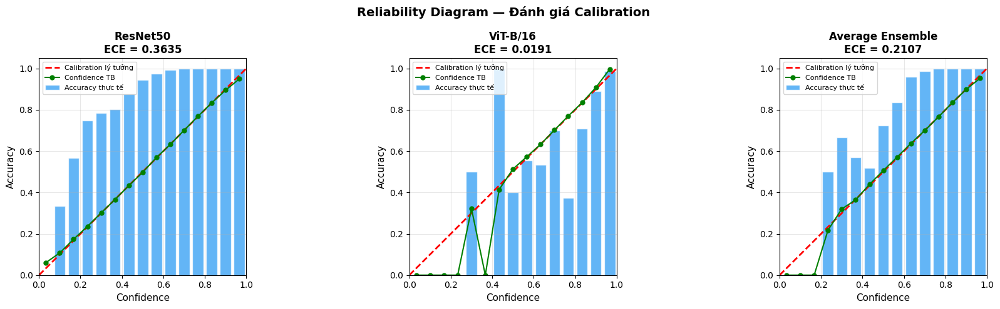


→ Cách đọc biểu đồ:
  - Thanh xanh = accuracy thực tế trong từng khoảng confidence
  - Đường đỏ = calibration lý tưởng (confidence = accuracy)
  - Thanh xanh trên đường đỏ → mô hình 'thiếu tự tin' (underconfident)
  - Thanh xanh dưới đường đỏ → mô hình 'quá tự tin' (overconfident)


In [50]:
# ======================================================
# Reliability Diagram — So sánh 3 mô hình
# ======================================================
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, name, bin_accs, bin_confs, bin_sizes, ece_val in [
    (axes[0], 'ResNet50', resnet_bin_accs, resnet_bin_confs, resnet_bin_sizes, resnet_ece),
    (axes[1], 'ViT-B/16', vit_bin_accs, vit_bin_confs, vit_bin_sizes, vit_ece),
    (axes[2], 'Average Ensemble', avg_bin_accs, avg_bin_confs, avg_bin_sizes, avg_ece),
]:
    n_bins = len(bin_accs)
    bin_centers = (bins[:-1] + bins[1:]) / 2
    bin_width = 1.0 / n_bins

    # Thanh accuracy thực tế
    ax.bar(bin_centers, bin_accs, width=bin_width * 0.8,
           color='#2196F3', alpha=0.7, edgecolor='white', label='Accuracy thực tế')

    # Đường chéo lý tưởng (perfect calibration)
    ax.plot([0, 1], [0, 1], 'r--', linewidth=2, label='Calibration lý tưởng')

    # Đường confidence trung bình
    ax.plot(bin_centers, bin_confs, 'go-', markersize=5, label='Confidence TB')

    ax.set_xlabel('Confidence', fontsize=11)
    ax.set_ylabel('Accuracy', fontsize=11)
    ax.set_title(f'{name}\nECE = {ece_val:.4f}', fontsize=12, fontweight='bold')
    ax.legend(fontsize=8)
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1.05)
    ax.grid(True, alpha=0.3)
    ax.set_aspect('equal')

plt.suptitle('Reliability Diagram — Đánh giá Calibration',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n→ Cách đọc biểu đồ:")
print("  - Thanh xanh = accuracy thực tế trong từng khoảng confidence")
print("  - Đường đỏ = calibration lý tưởng (confidence = accuracy)")
print("  - Thanh xanh trên đường đỏ → mô hình 'thiếu tự tin' (underconfident)")
print("  - Thanh xanh dưới đường đỏ → mô hình 'quá tự tin' (overconfident)")


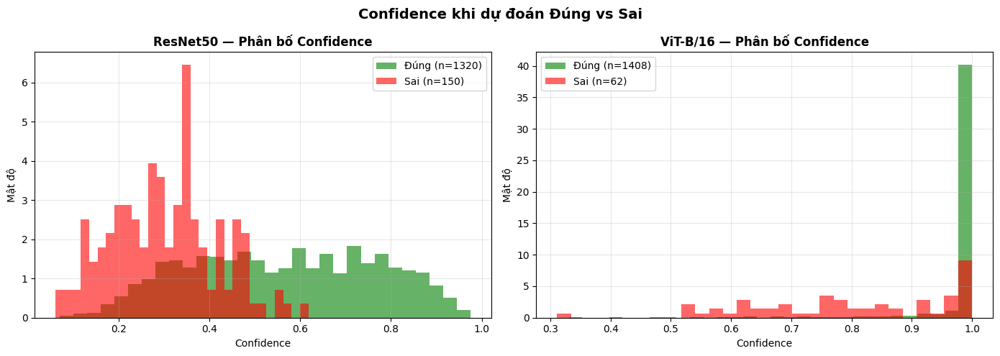


→ Nhận xét:
  - Mô hình tốt: confidence cao khi đúng, thấp khi sai
  - Nếu 2 phân bố tách biệt rõ → mô hình 'biết khi nào mình sai'
  - Nếu chồng lấp nhiều → mô hình khó phân biệt đúng/sai qua confidence


In [51]:
# ======================================================
# Phân bố Confidence cho dự đoán đúng vs sai
# ======================================================
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, name, probs, preds in [
    (axes[0], 'ResNet50', resnet_probs, resnet_preds),
    (axes[1], 'ViT-B/16', vit_probs, vit_preds),
]:
    confidences = np.max(probs, axis=1)
    correct_mask = (preds == true_labels)

    # Phân bố confidence khi đúng vs sai
    ax.hist(confidences[correct_mask], bins=30, alpha=0.6, color='green',
            label=f'Đúng (n={correct_mask.sum()})', density=True)
    ax.hist(confidences[~correct_mask], bins=30, alpha=0.6, color='red',
            label=f'Sai (n={(~correct_mask).sum()})', density=True)

    ax.set_xlabel('Confidence')
    ax.set_ylabel('Mật độ')
    ax.set_title(f'{name} — Phân bố Confidence', fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.suptitle('Confidence khi dự đoán Đúng vs Sai', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n→ Nhận xét:")
print("  - Mô hình tốt: confidence cao khi đúng, thấp khi sai")
print("  - Nếu 2 phân bố tách biệt rõ → mô hình 'biết khi nào mình sai'")
print("  - Nếu chồng lấp nhiều → mô hình khó phân biệt đúng/sai qua confidence")


### 8.8 Demo ứng dụng với GradioGiao diện cho phép:
####- Upload ảnh và xem kết quả phân loại
####- Chọn mô hình (ResNet50 hoặc ViT-B/16)
####- Xem Grad-CAM và Top-5 dự đoán
####- So sánh 2 mô hình trên cùng 1 ảnh
####- Test robustness với nhiễu

In [52]:
import gradio as gr
import matplotlib
matplotlib.use('Agg')  # Tránh lỗi display trên server
import matplotlib.gridspec as gridspec
import io
from PIL import Image, ImageFilter, ImageDraw
import torch.nn.functional as F

# ================================================================
# Hàm tiện ích cho demo
# ================================================================
def make_overlay(img_vis, cam, cmap_name='jet', alpha=0.5):
    """Overlay heatmap Grad-CAM lên ảnh gốc."""
    fig, ax = plt.subplots(1, 1, figsize=(4, 4))
    ax.imshow(img_vis.permute(1, 2, 0).numpy())
    ax.imshow(cam, cmap=cmap_name, alpha=alpha)
    ax.axis('off')
    fig.tight_layout(pad=0)
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight', pad_inches=0, dpi=100)
    plt.close(fig)
    buf.seek(0)
    return Image.open(buf)

def make_chart(probs, classes, top_k=5):
    """Tạo biểu đồ bar ngang Top-K predictions."""
    top_idx = np.argsort(probs)[::-1][:top_k]
    names = [classes[i].replace('_', ' ') for i in top_idx]
    vals = [probs[i] * 100 for i in top_idx]
    fig, ax = plt.subplots(figsize=(5, 3))
    colors = ['#1D9E75'] + ['#378ADD'] * (top_k - 1)
    ax.barh(range(top_k - 1, -1, -1), vals, color=colors,
            edgecolor='black', linewidth=0.3, height=0.6)
    ax.set_yticks(range(top_k - 1, -1, -1))
    ax.set_yticklabels(names, fontsize=10)
    ax.set_xlim(0, 105)
    for i, v in enumerate(vals):
        ax.text(v + 1, top_k - 1 - i, f'{v:.1f}%', va='center',
                fontsize=9, fontweight='bold')
    ax.set_title('Top-5 dự đoán', fontweight='bold')
    fig.tight_layout()
    buf = io.BytesIO()
    fig.savefig(buf, format='png', dpi=100)
    plt.close(fig)
    buf.seek(0)
    return Image.open(buf)

def apply_perturbation(img_pil, perturbation):
    """Áp dụng nhiễu lên ảnh để test robustness."""
    if perturbation == 'Noise (light)':
        a = np.array(img_pil).astype(float) / 255.
        return Image.fromarray((np.clip(a + np.random.randn(*a.shape) * 0.1, 0, 1) * 255).astype(np.uint8))
    elif perturbation == 'Noise (heavy)':
        a = np.array(img_pil).astype(float) / 255.
        return Image.fromarray((np.clip(a + np.random.randn(*a.shape) * 0.25, 0, 1) * 255).astype(np.uint8))
    elif perturbation == 'Blur':
        return img_pil.filter(ImageFilter.GaussianBlur(radius=5))
    elif perturbation == 'Occlusion 30%':
        img = img_pil.copy()
        w, h = img.size
        d = ImageDraw.Draw(img)
        bw, bh = int(w * 0.3), int(h * 0.3)
        x0 = np.random.randint(0, max(w - bw, 1))
        y0 = np.random.randint(0, max(h - bh, 1))
        d.rectangle([x0, y0, x0 + bw, y0 + bh], fill=(128, 128, 128))
        return img
    return img_pil

def run_gradcam(model, target_layer, img_tensor, reshape_fn=None):
    """Chạy Grad-CAM và trả về heatmap + xác suất dự đoán."""
    model.eval()
    with torch.no_grad():
        logits = model(img_tensor)
        probs = torch.softmax(logits, dim=1)[0].cpu().numpy()
    pred = int(probs.argmax())
    cam = GradCAM(model=model, target_layers=[target_layer],
                  reshape_transform=reshape_fn)
    targets = [ClassifierOutputTarget(pred)]
    grayscale_cam = cam(input_tensor=img_tensor, targets=targets)[0]
    return grayscale_cam, pred, probs


In [53]:
# ================================================================
# TAB 1: Phân loại + Grad-CAM
# ================================================================
def gradio_classify(image, model_choice, perturbation):
    """Phân loại ảnh và hiển thị Grad-CAM."""
    if image is None:
        return None, None, 'Vui lòng upload ảnh'
    img_pil = apply_perturbation(Image.fromarray(image).convert('RGB'), perturbation)
    to_t = transforms.ToTensor()
    norm = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    img_vis = to_t(transforms.Resize((224, 224))(img_pil))
    img_norm = norm(img_vis.clone()).unsqueeze(0).to(device)

    if model_choice == 'ResNet50':
        cam_map, pred, probs = run_gradcam(
            resnet, resnet.layer4[-1], img_norm, reshape_fn=None)
        overlay = make_overlay(img_vis, cam_map, 'jet')
    else:
        cam_map, pred, probs = run_gradcam(
            vit, vit.blocks[-1].norm1, img_norm, reshape_fn=vit_reshape_transform)
        overlay = make_overlay(img_vis, cam_map, 'hot')

    chart = make_chart(probs, class_names)
    info = f'**{class_names[pred].replace("_", " ")}** ({probs[pred]*100:.1f}%)\n'
    info += f'Mô hình: {model_choice}\n'
    if perturbation != 'None':
        info += f'Nhiễu: {perturbation}\n'
    return overlay, chart, info

# ================================================================
# TAB 2: So sánh 2 mô hình
# ================================================================
def gradio_compare(image):
    """So sánh kết quả 2 mô hình trên cùng 1 ảnh."""
    if image is None:
        return None, None, 'Vui lòng upload ảnh'
    img_pil = Image.fromarray(image).convert('RGB')
    to_t = transforms.ToTensor()
    norm = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    img_vis = to_t(transforms.Resize((224, 224))(img_pil))
    img_norm = norm(img_vis.clone()).unsqueeze(0).to(device)

    # ResNet50
    cam_r, pred_r, prob_r = run_gradcam(
        resnet, resnet.layer4[-1], img_norm, reshape_fn=None)
    ov_r = make_overlay(img_vis, cam_r, 'jet')

    # ViT-B/16
    cam_v, pred_v, prob_v = run_gradcam(
        vit, vit.blocks[-1].norm1, img_norm, reshape_fn=vit_reshape_transform)
    ov_v = make_overlay(img_vis, cam_v, 'hot')

    info = f'### ResNet50 (CNN)\n'
    info += f'**{class_names[pred_r].replace("_", " ")}** — {prob_r[pred_r]*100:.1f}%\n\n'
    info += f'### ViT-B/16 (Transformer)\n'
    info += f'**{class_names[pred_v].replace("_", " ")}** — {prob_v[pred_v]*100:.1f}%\n'
    return ov_r, ov_v, info

# ================================================================
# Giao diện Gradio
# ================================================================
with gr.Blocks(title='Oxford Pets Classifier', theme=gr.themes.Soft()) as demo:
    gr.Markdown(
        '# Oxford Pets Classifier\n'
        '### ResNet50 (CNN) vs ViT-B/16 (Vision Transformer) — 37 giống thú cưng\n'
        'Upload ảnh chó hoặc mèo để phân loại! Hỗ trợ Grad-CAM và so sánh mô hình.'
    )

    with gr.Tabs():
        # === TAB 1: Phân loại + Grad-CAM ===
        with gr.TabItem('Phân loại + Grad-CAM'):
            with gr.Row():
                with gr.Column(scale=1):
                    inp1 = gr.Image(label='Upload ảnh thú cưng', type='numpy')
                    mdl1 = gr.Radio(['ResNet50', 'ViT-B/16'], value='ResNet50', label='Chọn mô hình')
                    pert1 = gr.Dropdown(
                        ['None', 'Noise (light)', 'Noise (heavy)', 'Blur', 'Occlusion 30%'],
                        value='None', label='Nhiễu (test robustness)')
                    btn1 = gr.Button('Phân loại', variant='primary')
                with gr.Column(scale=1):
                    out_ov = gr.Image(label='Grad-CAM')
                    out_ch = gr.Image(label='Top-5 Confidence')
                    out_info = gr.Markdown()
            btn1.click(gradio_classify, [inp1, mdl1, pert1], [out_ov, out_ch, out_info])

        # === TAB 2: So sánh 2 mô hình ===
        with gr.TabItem('So sánh CNN vs ViT'):
            with gr.Row():
                with gr.Column(scale=1):
                    inp3 = gr.Image(label='Upload ảnh', type='numpy')
                    btn3 = gr.Button('So sánh', variant='primary')
                with gr.Column(scale=1):
                    out_r = gr.Image(label='ResNet50 — Grad-CAM')
                    out_v = gr.Image(label='ViT-B/16 — Grad-CAM')
                    out_cmp = gr.Markdown()
            btn3.click(gradio_compare, [inp3], [out_r, out_v, out_cmp])

        # === TAB 3: Thông tin ===
        with gr.TabItem('Thông tin'):
            gr.Markdown(
                '### Hai mô hình so sánh:\n\n'
                '**ResNet50 (CNN)** — pretrained ImageNet, fine-tuned 37 lớp.\n'
                '~25.6M params. Kiến trúc CNN kinh điển với residual connections.\n\n'
                '**ViT-B/16 (Vision Transformer)** — pretrained ImageNet, fine-tuned.\n'
                '~86M params. Chia ảnh thành 16×16 patches, dùng self-attention.\n\n'
                '### Chiến lược Fine-tune:\n'
                '- **Phase 1:** Đóng băng backbone, chỉ train classifier head\n'
                '- **Phase 2:** Mở toàn bộ, fine-tune end-to-end với LR thấp\n\n'
                '### Trực quan hóa:\n'
                '- **Grad-CAM**: Vùng ảnh ảnh hưởng đến dự đoán\n'
                '- **Perturbation**: Test robustness với noise, blur, occlusion\n\n'
                '---\n'
                '*ĐH Bách Khoa — CO5085 Học sâu và ứng dụng trong thị giác máy tính*'
            )

demo.launch(share=True)


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://70b2cdd176b59b1d26.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


---
### Ghi chú quan trọng
- Nhớ chọn **Runtime → Change runtime type → T4 GPU** trước khi chạy.
- **Dataset** được cache trên Drive (`DL_Assignment1/data/`), lần chạy sau không cần tải lại.
- **Checkpoint** lưu tại `DL_Assignment1/checkpoints/`. Khi chạy lại, notebook tự load checkpoint và bỏ qua training.
- Muốn **train lại từ đầu**: xóa file checkpoint tương ứng trên Drive.
- Có thể điều chỉnh `NUM_EPOCHS`, `BATCH_SIZE`, `lr` để tối ưu kết quả.

### Tóm tắt nội dung đã thực hiện:
1. ✅ EDA: Phân bố lớp, kích thước ảnh, ảnh mẫu
2. ✅ Chuẩn bị dữ liệu: Dataset, DataLoader, Augmentation
3. ✅ CNN (ResNet50): Phase 1 (Freeze) → Phase 2 (Full Fine-tune)
4. ✅ ViT (ViT-B/16): Phase 1 (Freeze) → Phase 2 (Full Fine-tune)
5. ✅ So sánh: Bảng metrics, biểu đồ, confusion matrix, classification report
6. ✅ So sánh chiến lược fine-tune: Freeze Backbone vs Full Fine-tune
7. ✅ Grad-CAM: Giải thích mô hình (interpretability)
8. ✅ Phân tích lỗi: Mẫu sai, cặp lớp nhầm lẫn
9. ✅ Augmentation & Robustness: So sánh có/không aug + test nhiễu
10. ✅ Hiệu quả mô hình: Accuracy vs kích thước vs thời gian suy luận
11. ✅ Ensemble: Average, Weighted, Max Confidence — CNN + ViT
12. ✅ Calibration: ECE, Reliability Diagram, phân bố confidence
13. ✅ Demo Gradio: Giao diện phân loại + Grad-CAM + So sánh